# Project: Predicting the outcome of Football Matches

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#data_wrangling">Data Wrangling</a></li>
</ul>

<a id='introduction'></a>
## Introduction

Based on the datasets provided on [kaggle](https://www.kaggle.com) which include basic match data, FIFA player statistics and book-keeper data, I will build a model to predict the probability of each match outcome – home-win, draw, or away-win. 

This notebook concentrates on the data-wrangling section (the most labor-intensive part) of the project which will cover the following aspects of the data:

1. Gathering
2. Assessing
3. Cleaning

<a id='data_wrangling'></a>
## Data Wrangling

## Gather

In [1]:
#Import statements for libraries needed for this project

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import date
import seaborn as sns
import calendar

#Show visualisations in the notebook
%matplotlib inline

In [2]:
#Set display options in order the inspect the data in the extensive datasets properly
#This increases the default display options seen when exploring the dataframes - printing with head() etc...

pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 2000)
pd.set_option('display.width', 2000)

The main European Football database was stored in an SQLite database. I used the software 'DB Browser for SQLite' and the following SQL statements to extract the datasets I needed:

__Matches__

```mysql
SELECT *
FROM Match m
JOIN League l
ON m.league_id = l.id
JOIN Country c
ON m.country_id = c.id
INNER JOIN Team as t1
ON m.home_team_api_id = t1.team_api_id
INNER JOIN Team as t2
ON m.away_team_api_id = t2.team_api_id;
```

__Players__
``` mysql
SELECT *
FROM Player_Attributes pa
JOIN Player p
ON p.player_api_id = pa.player_api_id;
```

In [13]:
#Import datasets

# +25,000 Football matches - Seasons 2008 to 2016.        
matches = pd.read_csv('main_matches.csv')

# +10,000 Football players ratings - Seasons 2008 to 2016
players_ratings = pd.read_csv('main_players.csv')

## Assess

### Assessing Matches

##### Visual Assessment: Acquainting Myself

In [4]:
#Visualize the first 5 rows of the dataset matches
matches.head()

,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,goal,shoton,shotoff,foulcommit,card,cross,corner,possession,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,name,id.2,name.1,id.3,team_api_id,team_fifa_api_id,team_long_name,team_short_name,id.4,team_api_id.1,team_fifa_api_id.1,team_long_name.1,team_short_name.1
0,1,1,1,2008/2009,1,2008-08-17 00:00:00,492473,9987,9993,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.73,3.40,5.00,1.75,3.35,4.20,1.85,3.2,3.5,1.80,3.3,3.75,NaN,NaN,NaN,1.70,3.30,4.33,1.90,3.3,4.00,1.65,3.40,4.50,1.78,3.25,4.00,1.73,3.40,4.20,1,1,Belgium Jupiler League,1,Belgium,1,9987,673.0,KRC Genk,GEN,2,9993,675.0,Beerschot AC,BAC
1,2,1,1,2008/2009,1,2008-08-16 00:00:00,492474,10000,9994,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.95,3.20,3.60,1.80,3.30,3.95,1.90,3.2,3.5,1.90,3.2,3.50,NaN,NaN,NaN,1.83,3.30,3.60,1.95,3.3,3.80,2.00,3.25,3.25,1.85,3.25,3.75,1.91,3.25,3.60,1,1,Belgium Jupiler League,1,Belgium,3,10000,15005.0,SV Zulte-Waregem,ZUL,4,9994,2007.0,Sporting Lokeren,LOK
2,3,1,1,2008/2009,1,2008-08-16 00:00:00,492475,9984,8635,0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.38,3.30,2.75,2.40,3.30,2.55,2.60,3.1,2.3,2.50,3.2,2.50,NaN,NaN,NaN,2.50,3.25,2.40,2.63,3.3,2.50,2.35,3.25,2.65,2.50,3.20,2.50,2.30,3.20,2.75,1,1,Belgium Jupiler League,1,Belgium,5,9984,1750.0,KSV Cercle Brugge,CEB,6,8635,229.0,RSC Anderlecht,AND
3,4,1,1,2008/2009,1,2008-08-17 00:00:00,492476,9991,9998,5,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.44,3.75,7.50,1.40,4.00,6.80,1.40,3.9,6.0,1.44,3.6,6.50,NaN,NaN,NaN,1.44,3.75,6.00,1.44,4.0,7.50,1.45,3.75,6.50,1.50,3.75,5.50,1.44,3.75,6.50,1,1,Belgium Jupiler League,1,Belgium,7,9991,674.0,KAA Gent,GEN,8,9998,1747.0,RAEC Mons,MON
4,5,1,1,2008/2009,1,2008-08-16 00:00:00,492477,7947,9985,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [5]:
#Visualize the last 5 rows of the dataset matches
matches.tail()

,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,goal,shoton,shotoff,foulcommit,card,cross,corner,possession,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,name,id.2,name.1,id.3,team_api_id,team_fifa_api_id,team_long_name,team_short_name,id.4,team_api_id.1,team_fifa_api_id.1,team_long_name.1,team_short_name.1
25974,25975,24558,24558,2015/2016,9,2015-09-22 00:00:00,1992091,10190,10191,1,0,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,42231.0,678384.0,95220.0,638592.0,413155.0,45780.0,171229.0,67333.0,119839.0,143790.0,195215.0,462944.0,563066.0,8800.0,67304.0,158253.0,133126.0,186524.0,93223.0,121115.0,232110.0,289732.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24558,24558,Switzerland Super League,24558,Switzerland,49479,10190,898.0,FC St. Gallen,GAL,49837,10191,1715.0,FC Thun,THU
25975,25976,24558,24558,2015/2016,9,2015-09-23 00:00:00,1992092,9824,10199,1,2,1.0,3.0,5.0,7.0,2.0,4.0,6.0,8.0,5.0,4.0,6.0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,3.0,5.0,7.0,1.0,3.0,3.0,3.0,7.0,7.0,7.0,7.0,9.0,11.0,11.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,10.0,10.0,10.0,33272.0,41621.0,25813.0,257845.0,114735.0,42237.0,113227.0,358156.0,32343.0,531309.0,37257.0,42276.0,114792.0,150007.0,178119.0,27232.0,570830.0,260708.0,201704.0,36382.0,34082.0,95257.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24558,24558,Switzerland Super League,24558,Switzerland,49122,9824,286.0,FC Vaduz,VAD,49121,10199,897.0,FC Luzern,LUZ
25976,25977,24558,24558,2015/2016,9,2015-09-23 00:00:00,1992093,9956,10179,2,0,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,157856.0,274779.0,177689.0,294256.0,42258.0,39979.0,173936.0,147959.0,451983.0,80564.0,289472.0,10637.0,67349.0,202663.0,32597.0,114794.0,188114.0,25840.0,482200.0,95230.0,451335.0,275122.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24558,24558,Switzerland Super League,24558,Switzerland,49115,9956,322.0,Grasshopper Club Zürich,GRA,49120,10179,110770.0,FC Sion,SIO
25977,25978,24558,24558,2015/2016,9,2015-09-22 00:00:00,1992094,7896,10243,0,0,1.0,2.0,4.0,6.0,8.0,3.0,7.0,5.0,3.0,5.0,7.0,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,10.0,10.0,10.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,NaN,8881.0,173534.0,39646.0,282287.0,340790.0,393337.0,8893.0,614454.0,93229.0,178142.0,274776.0,121080.0,197757

Quick Overview of missing values accross this dataset.

### Number of samples & columns in the matches dataset

In [6]:
#Check if there are any null values in the dataframe
matches.info(verbose=True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25979 entries, 0 to 25978
Data columns (total 130 columns):
id                    25979 non-null int64
country_id            25979 non-null int64
league_id             25979 non-null int64
season                25979 non-null object
stage                 25979 non-null int64
date                  25979 non-null object
match_api_id          25979 non-null int64
home_team_api_id      25979 non-null int64
away_team_api_id      25979 non-null int64
home_team_goal        25979 non-null int64
away_team_goal        25979 non-null int64
home_player_X1        24158 non-null float64
home_player_X2        24158 non-null float64
home_player_X3        24147 non-null float64
home_player_X4        24147 non-null float64
home_player_X5        24147 non-null float64
home_player_X6        24147 non-null float64
home_player_X7        24147 non-null float64
home_player_X8        24147 non-null float64
home_player_X9        24147 non-null float64
home_playe

In [7]:
#Descriptive statistics for the matches dataset
matches.describe()

,id,country_id,league_id,stage,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,id.2,id.3,team_api_id,team_fifa_api_id,id.4,team_api_id.1,team_fifa_api_id.1
count,25979.000000,25979.000000,25979.000000,25979.000000,2.597900e+04,25979.000000,25979.000000,25979.000000,25979.000000,24158.000000,24158.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.00000,24147.000000,24147.000000,24147.000000,24146.000000,24146.000000,24140.000000,24158.000000,24158.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.00000,24147.000000,24147.0,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24147.000000,24146.000000,24146.000000,24140.000000,24755.000000,24664.000000,24698.000000,24656.000000,24663.000000,24654.000000,24752.000000,24670.000000,24706.000000,24543.000000,24424.000000,24745.000000,24701.000000,24686.000000,24658.000000,24644.000000,24666.000000,24744.000000,24638.000000,24651.000000,24538.000000,24425.000000,22592.000000,22592.000000,22592.000000,22575.000000,22575.000000,22575.000000,22520.000000,22520.000000,22520.000000,22556.000000,22556.000000,22556.000000,11168.000000,11168.000000,11168.000000,22571.000000,22571.000000,22571.000000,17097.000000,17097.000000,17097.000000,22568.000000,22568.000000,22568.000000,14162.000000,14162.000000,14162.000000,14161.000000,14161.000000,14161.000000,25979.000000,25979.000000,25979.000000,25979.000000,25979.000000,25801.000000,25979.000000,25979.000000,25801.000000
mean,12990.000000,11738.630317,11738.630317,18.242773,1.195429e+06,9984.371993,9984.475115,1.544594,1.160938,0.999586,2.073516,4.061001,6.049199,7.544871,3.185158,4.769909,5.309604,5.822048,5.389407,5.783244,1.000290,2.074585,4.058558,6.052222,7.52549,3.195387,4.742660,5.294115,5.807546,5.476187,5.766114,0.999627,2.998634,3.000083,3.000414,3.237214,6.476954,6.672257,7.238953,8.026339,9.218868,10.43699,1.000248,3.0,3.000166,3.000248,3.245124,6.469706,6.680292,7.246366,8.022115,9.161186,10.455178,76638.362432,106854.091996,91601.289457,94540.204494,109527.842071,102308.768516,97287.636918,107290.992947,111131.536914,105612.508373,103413.870660,76628.199879,107614.617424,91126.781293,95083.910617,109800.936901,102308.262588,97898.056014,109265.114214,111087.003448,107149.115943,104932.876970,2.628818,3.839684,4.662222,2.559245,3.747597,4.396949,2.467613,3.608932,4.150575,2.536202,3.711740,4.385351,2.816447,4.132324,4.972744,2.578737,3.665295,4.482585,2.566061,3.755879,4.622343,2.668107,3.899048,4.840281,2.498764,3.648189,4.353097,2.497894,3.660742,4.405663,11738.630317,11738.630317,11738.630317,23871.933600,9984.371993,15849.694004,23871.830517,9984.475115,15848.954847
std,7499.635658,7553.9367

In [8]:
# The output seen below is also seen with the other in-game events
matches.goal.value_counts()

<goal />                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

### Duplicate rows in the matches dataset

In [9]:
#Find number of duplicate rows
sum(matches.duplicated())

0

Check if the number of games played by team and season is the same for each team.

In [10]:
# Games per league, per match_season and per team
games_played = matches.groupby(['name', 'season', 'team_long_name']).count()
games_played

id  country_id  league_id  stage  date  match_api_id  home_team_api_id  away_team_api_id  home_team_goal  away_team_goal  home_player_X1  home_player_X2  home_player_X3  home_player_X4  home_player_X5  home_player_X6  home_player_X7  home_player_X8  home_player_X9  home_player_X10  home_player_X11  away_player_X1  away_player_X2  away_player_X3  away_player_X4  away_player_X5  away_player_X6  away_player_X7  away_player_X8  away_player_X9  away_player_X10  away_player_X11  home_player_Y1  home_player_Y2  home_player_Y3  home_player_Y4  home_player_Y5  home_player_Y6  home_player_Y7  home_player_Y8  home_player_Y9  home_player_Y10  home_player_Y11  away_player_Y1  away_player_Y2  away_player_Y3  away_player_Y4  away_player_Y5  away_player_Y6  away_player_Y7  away_player_Y8  away_player_Y9  away_player_Y10  away_player_Y11  home_player_1  home_player_2  home_player_3  home_player_4  home_player_5  home_player_6  home_player_7  home_player_8  home_player_9  home_player_10  home_player_11  away_player_1  away_player_2  away_player_3  away_player_4  away_player_5  away_player_6  away_player_7  away_player_8  away_player_9  away_player_10  away_player_11  goal  shoton  shotoff  foulcommit  card  cross  corner  possession  B365H  B365D  B365A  BWH  BWD  BWA  IWH  IWD  IWA  LBH  LBD  LBA  PSH  PSD  PSA  WHH  WHD  WHA  SJH  SJD  SJA  VCH  VCD  VCA  GBH  GBD  GBA  BSH  BSD  BSA  id.1  country_id.1  id.2  name.1  id.3  team_api_id  team_fifa_api_id  team_short_name  id.4  team_api_id.1  team_fifa_api_id.1  team_long_name.1  team_short_name.1
name                     season    team_long_name                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
Belgium Jupiler League   2008/2009 Beerschot AC                  17          17         17     17    17            17                17                17              17              17               5               5               5               5               5               5               5               5               5                5                5               5               5               5               5               5               5               5               5               5                5                5               5               5               5               5               5               5               5               5               5                5                5               5               5               5               5               5               5      

There seems to be a few odd seasons in the data-set, where some football teams do not play the same number of matches as the others. We will have to investigate this further.

### Assessing Player Ratings


##### Visual Assessment: Acquainting Myself

In [14]:
#Visualize the first rows of the dataset players ratings
players_ratings.head()

,id,player_fifa_api_id,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,free_kick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,id.1,player_api_id.1,player_name,player_fifa_api_id.1,birthday,height,weight
0,1,218353,505942,2016-02-18 00:00:00,67.0,71.0,right,medium,medium,49.0,44.0,71.0,61.0,44.0,51.0,45.0,39.0,64.0,49.0,60.0,64.0,59.0,47.0,65.0,55.0,58.0,54.0,76.0,35.0,71.0,70.0,45.0,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0,1,505942,Aaron Appindangoye,218353,1992-02-29 00:00:00,182.88,187
1,2,218353,505942,2015-11-19 00:00:00,67.0,71.0,right,medium,medium,49.0,44.0,71.0,61.0,44.0,51.0,45.0,39.0,64.0,49.0,60.0,64.0,59.0,47.0,65.0,55.0,58.0,54.0,76.0,35.0,71.0,70.0,45.0,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0,1,505942,Aaron Appindangoye,218353,1992-02-29 00:00:00,182.88,187
2,3,218353,505942,2015-09-21 00:00:00,62.0,66.0,right,medium,medium,49.0,44.0,71.0,61.0,44.0,51.0,45.0,39.0,64.0,49.0,60.0,64.0,59.0,47.0,65.0,55.0,58.0,54.0,76.0,35.0,63.0,41.0,45.0,54.0,48.0,65.0,66.0,69.0,6.0,11.0,10.0,8.0,8.0,1,505942,Aaron Appindangoye,218353,1992-02-29 00:00:00,182.88,187
3,4,218353,505942,2015-03-20 00:00:00,61.0,65.0,right,medium,medium,48.0,43.0,70.0,60.0,43.0,50.0,44.0,38.0,63.0,48.0,60.0,64.0,59.0,46.0,65.0,54.0,58.0,54.0,76.0,34.0,62.0,40.0,44.0,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0,1,505942,Aaron Appindangoye,218353,1992-02-29 00:00:00,182.88,187
4,5,218353,505942,2007-02-22 00:00:00,61.0,65.0,right,medium,medium,48.0,43.0,70.0,60.0,43.0,50.0,44.0,38.0,63.0,48.0,60.0,64.0,59.0,46.0,65.0,54.0,58.0,54.0,76.0,34.0,62.0,40.0,44.0,53.0,47.0,62.0,63.0,66.0,5.0,10.0,9.0,7.0,7.0,1,505942,Aaron Appindangoye,218353,1992-02-29 00:00:00,182.88,187


### Duplicate rows in the players ratings dataset

In [15]:
#Count number of duplicate rows
sum(players_ratings.duplicated())

0

### Number of samples & columns in the players ratings dataset

In [16]:
#Check if there are any null values in the dataframe
players_ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183978 entries, 0 to 183977
Data columns (total 49 columns):
id                      183978 non-null int64
player_fifa_api_id      183978 non-null int64
player_api_id           183978 non-null int64
date                    183978 non-null object
overall_rating          183142 non-null float64
potential               183142 non-null float64
preferred_foot          183142 non-null object
attacking_work_rate     180748 non-null object
defensive_work_rate     183142 non-null object
crossing                183142 non-null float64
finishing               183142 non-null float64
heading_accuracy        183142 non-null float64
short_passing           183142 non-null float64
volleys                 181265 non-null float64
dribbling               183142 non-null float64
curve                   181265 non-null float64
free_kick_accuracy      183142 non-null float64
long_passing            183142 non-null float64
ball_control            183142 non-

In [17]:
#Find for each column the number of missing values
players_ratings.isnull().sum()

id                         0
player_fifa_api_id         0
player_api_id              0
date                       0
overall_rating           836
potential                836
preferred_foot           836
attacking_work_rate     3230
defensive_work_rate      836
crossing                 836
finishing                836
heading_accuracy         836
short_passing            836
volleys                 2713
dribbling                836
curve                   2713
free_kick_accuracy       836
long_passing             836
ball_control             836
acceleration             836
sprint_speed             836
agility                 2713
reactions                836
balance                 2713
shot_power               836
jumping                 2713
stamina                  836
strength                 836
long_shots               836
aggression               836
interceptions            836
positioning              836
vision                  2713
penalties                836
marking       

In [ ]:
players_ratings.describe()

#### Quality
##### `matches` table
- Some Column names not descriptive
- Missing values (for certain columns) ***(can't clean)***
- In-game events are in xml format (goal, shoton, shotoff, foulcommit, card, cross, corner, possession)
- The dates in column 'date' are strings rather than datetime format
- Missing games for the Belgium Match Season 2013/2014
- Inconsistent data for the following Poland seasons, teams:
<ul>
<li>Match season 2008/2009, team Polonia Bytom 30</li>
<li>Match season 2010/2011, team Polonia Bytom 30</li>
<li>Match season 2011/2012, team Widzew Łódź 30</li>
    More to inspect
</ul>


- Erroneous datatypes 


##### `players_ratings` table
- Missing values (for certain columns)
- The dates in column 'date' and 'birthday' are strings rather than datetime format
- Weight is given in lbs rather than kilograms

- Erroneous datatypes 



#### Tidiness

##### `main_matches` table
- In-game events are not atomic, they should be split into respective team's events
- Several columns are duplicated or unnecessary.
- 



## Clean

Make a copy of the original dataframes, where I will do the cleaning on.

In [18]:
matches_clean = matches.copy()
players_ratings_clean = players_ratings.copy()

#### `matches`: Erroneous datatypes 

##### Define
Convert the 'date' column from string to datetime format.

##### Code

In [19]:
#Column 'date' is currently a string, convert to datetime format
matches_clean['date'] = pd.to_datetime(matches_clean['date'])

##### Test

In [20]:
#Check results.
matches_clean.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25979 entries, 0 to 25978
Data columns (total 130 columns):
id                    int64
country_id            int64
league_id             int64
season                object
stage                 int64
date                  datetime64[ns]
match_api_id          int64
home_team_api_id      int64
away_team_api_id      int64
home_team_goal        int64
away_team_goal        int64
home_player_X1        float64
home_player_X2        float64
home_player_X3        float64
home_player_X4        float64
home_player_X5        float64
home_player_X6        float64
home_player_X7        float64
home_player_X8        float64
home_player_X9        float64
home_player_X10       float64
home_player_X11       float64
away_player_X1        float64
away_player_X2        float64
away_player_X3        float64
away_player_X4        float64
away_player_X5        float64
away_player_X6        float64
away_player_X7        float64
away_player_X8        float64
aw

#### `matches`: In-game events are in xml format (goal, shoton, shotoff, foulcommit, card, cross, corner, possession)
*Note: the 'In-game events are not atomic, they should be split into respective team's events', which is a tidiness issue and not a completeness issue, is included in this header because it is also fixed by the cleaning operation that fixes the above observation. Multiple observations in one **Define, Code, and Test** header occurs multiple times in this notebook.*

##### Define
Extract the relevant information from the above mentioned columns by using an XML parser OR merge with football-data table that contains accurate statistics for most football leagues. The latter is the approach followed.

##### Code

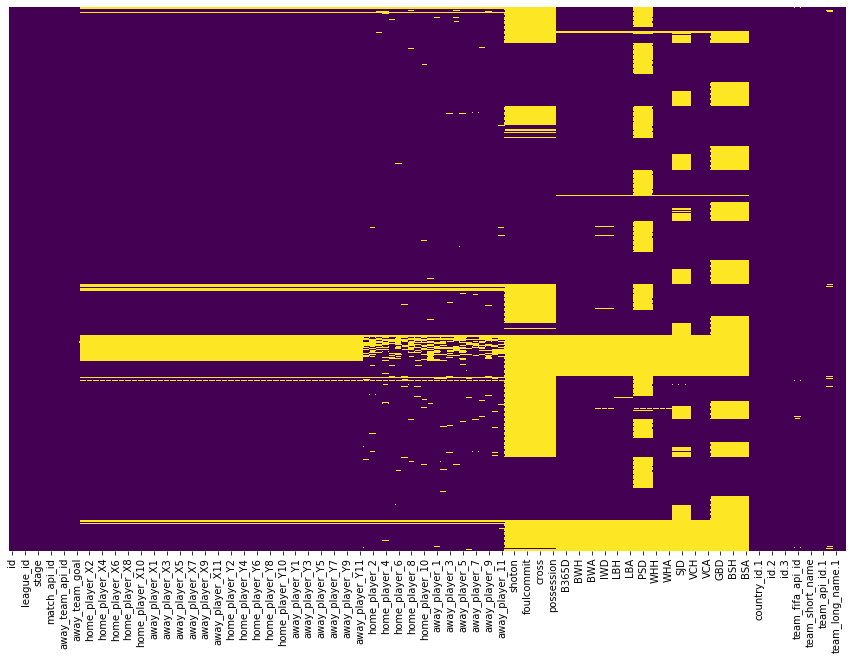

In [21]:
plt.figure(figsize=(15,10))
sns.heatmap(matches_clean.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [22]:
matches_clean.sample(5)

,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,goal,shoton,shotoff,foulcommit,card,cross,corner,possession,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,name,id.2,name.1,id.3,team_api_id,team_fifa_api_id,team_long_name,team_short_name,id.4,team_api_id.1,team_fifa_api_id.1,team_long_name.1,team_short_name.1
10308,10309,10257,10257,2008/2009,14,2008-11-30,539689,8636,9875,2,1,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,5.0,4.0,6.0,1.0,3.0,4.0,7.0,1.0,3.0,5.0,7.0,9.0,4.0,6.0,1.0,3.0,3.0,3.0,3.0,5.0,5.0,5.0,8.0,10.0,10.0,1.0,3.0,3.0,3.0,7.0,7.0,7.0,7.0,7.0,10.0,10.0,30989.0,34305.0,22984.0,30492.0,34304.0,30460.0,30930.0,30905.0,30724.0,NaN,35724.0,42042.0,39569.0,32769.0,39509.0,39535.0,24546.0,56585.0,41658.0,41661.0,24624.0,18925.0,<goal><value><comment>n</comment><stats><goals...,<shoton><value><event_incident_typefk>139</eve...,<shotoff><value><stats><shotoff>1</shotoff></s...,<foulcommit><value><stats><foulscommitted>1</f...,<card><value><comment>y</comment><stats><ycard...,<cross><value><stats><crosses>1</crosses></sta...,<corner><value><stats><corners>1</corners></st...,<possession><value><comment>70</comment><event...,1.50,3.8,7.5,1.45,3.75,7.00,1.45,3.6,7.0,1.57,3.25,5.50,NaN,NaN,NaN,1.44,3.60,6.50,1.57,3.50,7.00,1.50,3.60,7.5,1.50,3.75,7.00,1.50,3.6,6.50,10257,10257,Italy Serie A,10257,Italy,20528,8636,44.0,Inter,INT,20526,9875,48.0,Napoli,NAP
17361,17362,15722,15722,2014/2015,5,2014-08-16,1722124,8028,1601,0,1,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,38395.0,78537.0,429848.0,11061.0,43321.0,160845.0,NaN,68877.0,289178.0,281747.0,105535.0,275751.0,33807.0,13405.0,69619.0,282168.0,68786.0,30275.0,309868.0,287341.0,30278.0,115724.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15722,15722,Poland Ekstraklasa,15722,Poland,31457,8028,111086.0,Piast Gliwice,PIG,31446,1601,874.0,Ruch Chorzów,CHO
22128,22129,21518,21518,2009/2010,30,2010-04-04,685081,10281,10205,0,2,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,3.0,5.0,7.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,10.0,10.0,10.0,47566.0,37597.0,97486.0,34575.0,2790.0,38431.0,37507.0,156097.0,6911.0,41582.0,19243.0,41466.0,33733.0,38458.0,56678.0,40599.0,37480.0,42479.0,38362.0,38551.0,25986.0,38699.0,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,2.88,3.3,2.4,2.95,3.25,2.30,2.85,3.2,2.4,2.60,3.20,2.38,NaN,NaN,NaN,2.88,3.20,2.30,3.00,3.40,2.30,3.00,3.25,2.3,2.75,3.25,2.45,2.80,3.3,2.40,21518,21518,Spain LIGA BBVA,21518,Spain,43050,1028

In [47]:
# Contains football-data.co.uk collected results, fixtures and market odds as well as in-game statistics.
football_data = pd.read_csv('football_betting_odds.csv')

/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (35,48,81) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [48]:
football_data.head()

,Season,Date,Div,Country,League,Referee,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,PSH,PSD,PSA,B365H,B365D,B365A,LBH,LBD,LBA,BWH,BWD,BWA,ABP,AC,AF,AFKC,AHW,AO,AR,AS,AST,AT,AY,Attendance,B365<2.5,B365>2.5,B365AH,B365AHA,B365AHH,BSA,BSD,BSH,Bb1X2,BbAH,BbAHh,BbAv<2.5,BbAv>2.5,BbAvA,BbAvAHA,BbAvAHH,BbAvD,BbAvH,BbMx<2.5,BbMx>2.5,BbMxA,BbMxAHA,BbMxAHH,BbMxD,BbMxH,BbOU,GB<2.5,GB>2.5,GBA,GBAH,GBAHA,GBAHH,GBD,GBH,HBP,HC,HF,HFKC,HHW,HO,HR,HS,HST,HT,HY,IWA,IWD,IWH,LBAH,LBAHA,LBAHH,PSCA,PSCD,PSCH,SBA,SBD,SBH,SJA,SJD,SJH,SOA,SOD,SOH,SYA,SYD,SYH,VCA,VCD,VCH,WHA,WHD,WHH
0,2018/2019,2018-10-03 00:00:00,E1,England,Championship,O Langford,Sheffield Weds,West Brom,2,2,D,2,0,H,3.72,3.58,2.09,3.80,3.5,2.10,3.40,3.5,2.05,3.40,3.5,2.10,NaN,4.0,15.0,NaN,NaN,NaN,0.0,19.0,4.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.0,21.0,0.25,2.07,1.74,2.07,1.78,2.06,3.50,3.52,2.17,1.81,2.15,1.81,2.14,3.65,3.80,39.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,12.0,NaN,NaN,NaN,0.0,14.0,5.0,NaN,2.0,2.00,3.35,3.35,NaN,NaN,NaN,2.03,3.51,4.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.10,3.6,3.60,2.10,3.5,3.50
1,2018/2019,2018-10-03 00:00:00,E1,England,Championship,G Ward,Rotherham,Bristol City,0,0,D,0,0,D,3.58,3.50,2.17,3.75,3.5,2.10,3.50,3.3,2.10,3.40,3.3,2.15,NaN,3.0,15.0,NaN,NaN,NaN,0.0,13.0,3.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.0,21.0,0.25,1.83,1.96,2.12,1.81,2.05,3.39,3.50,1.92,2.05,2.20,1.86,2.12,3.50,3.75,39.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,12.0,NaN,NaN,NaN,0.0,21.0,6.0,NaN,2.0,2.05,3.20,3.35,NaN,NaN,NaN,2.02,3.66,3.89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.10,3.5,3.75,2.15,3.4,3.50
2,2018/2019,2018-10-03 00:00:00,E1,England,Championship,J Moss,Nott'm Forest,Millwall,2,2,D,1,0,H,1.93,3.57,4.34,1.95,3.5,4.33,1.91,3.3,4.20,1.91,3.4,4.10,NaN,7.0,11.0,NaN,NaN,NaN,0.0,20.0,10.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.0,21.0,-0.75,1.73,2.09,4.14,1.69,2.19,3.46,1.91,1.79,2.20,4.46,1.75,2.25,3.60,1.95,39.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,16.0,NaN,NaN,NaN,0.0,7.0,2.0,NaN,1.0,3.95,3.25,1.85,NaN,NaN,NaN,4.88,3.61,1.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.30,3.6,1.93,4.00,3.6,1.91
3,2018/2019,2018-10-03 00:00:00,E1,England,Championship,G Eltringham,Derby,Norwich,1,1,D,0,0,D,2.15,3.50,3.63,2.14,3.4,3.80,2.10,3.3,3.40,2.05,3.4,3.60,NaN,8.0,17.0,NaN,NaN,NaN,0.0,14.0,5.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.0,21.0,-0.25,1.79,2.01,3.53,2.02,1.83,3.36,2.12,1.86,2.10,3.80,2.07,1.87,3.50,2.20,39.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,12.0,NaN,NaN,NaN,0.0,14.0,6.0,NaN,1.0,3.35,3.15,2.05,NaN,NaN,NaN,3.87,3.71,2.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.60,3.5,2.15,3.40,3.4,2.15
4,2018/2019,2018-10-03 00:00:00,E1,England,Championship,R Jones,Blackburn,Sheffield United,0,2,A,0,0,D,2.90,3.35,2.62,2.87,3.4,2.60,2.80,3.2,2.55,2.80,3.3,2.50,NaN,7.0,9.0,NaN,NaN,NaN,0.0,13.0,7.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.0,21.0,0.25,1.74,2.07,2.55,2.17,1.71,3.24,2.82,1.81,2.15,2.65,2.25,1.75,3.40,2.92,39.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,16.0,NaN,NaN,NaN,0.0,13.0,2.0,NaN,1.0,2.50,3.10,2.70,NaN,NaN,NaN,2.20,3.48,3.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.63,3.3,2.90,2.55,3.3,2.80


In [49]:
football_data.info(verbose= True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132380 entries, 0 to 132379
Data columns (total 110 columns):
Season        132380 non-null object
Date          132380 non-null object
Div           132380 non-null object
Country       132380 non-null object
League        132380 non-null object
Referee       48269 non-null object
HomeTeam      131334 non-null object
AwayTeam      131334 non-null object
FTHG          132380 non-null int64
FTAG          132380 non-null int64
FTR           132379 non-null object
HTHG          132380 non-null int64
HTAG          132380 non-null int64
HTR           132336 non-null object
PSH           47550 non-null float64
PSD           47550 non-null float64
PSA           47550 non-null float64
B365H         117274 non-null float64
B365D         117274 non-null float64
B365A         117274 non-null float64
LBH           120824 non-null float64
LBD           120824 non-null float64
LBA           120827 non-null float64
BWH           108083 non-null float6

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(football_data.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [50]:
interesting_seasons =  ['2008/2009', '2009/2010', '2010/2011', '2011/2012', '2012/2013', '2013/2014', '2014/2015',
                       '2015/2016']

#Having conducted research it looks like Le Championnat is equivalent to 'Ligue 1' for France
#For Portugal it would be Liga I - Liga ZON Sagres
#Premier League is for both England and Scotland
interesting_leagues = ['Jupiler League', 'Premier League', 'Le Championnat', 'Bundesliga 1', 'Serie A', 'Eredivisie',
                       'Liga I', 'La Liga Primera Division']

football_data = football_data[football_data.Season.isin(interesting_seasons) & 
                              football_data.League.isin(interesting_leagues)]


In [51]:
football_data.info(verbose = True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22888 entries, 17327 to 79392
Data columns (total 110 columns):
Season        22888 non-null object
Date          22888 non-null object
Div           22888 non-null object
Country       22888 non-null object
League        22888 non-null object
Referee       4636 non-null object
HomeTeam      22888 non-null object
AwayTeam      22888 non-null object
FTHG          22888 non-null int64
FTAG          22888 non-null int64
FTR           22888 non-null object
HTHG          22888 non-null int64
HTAG          22888 non-null int64
HTR           22887 non-null object
PSH           11419 non-null float64
PSD           11419 non-null float64
PSA           11419 non-null float64
B365H         22882 non-null float64
B365D         22882 non-null float64
B365A         22882 non-null float64
LBH           22845 non-null float64
LBD           22845 non-null float64
LBA           22845 non-null float64
BWH           22865 non-null float64
BWD           228

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(football_data.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [52]:
# Football Data grouped by league, match season ordered

football_data_sorted = football_data.sort_values(by=['League', 'Season'])
football_data_sorted.head()

,Season,Date,Div,Country,League,Referee,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,PSH,PSD,PSA,B365H,B365D,B365A,LBH,LBD,LBA,BWH,BWD,BWA,ABP,AC,AF,AFKC,AHW,AO,AR,AS,AST,AT,AY,Attendance,B365<2.5,B365>2.5,B365AH,B365AHA,B365AHH,BSA,BSD,BSH,Bb1X2,BbAH,BbAHh,BbAv<2.5,BbAv>2.5,BbAvA,BbAvAHA,BbAvAHH,BbAvD,BbAvH,BbMx<2.5,BbMx>2.5,BbMxA,BbMxAHA,BbMxAHH,BbMxD,BbMxH,BbOU,GB<2.5,GB>2.5,GBA,GBAH,GBAHA,GBAHH,GBD,GBH,HBP,HC,HF,HFKC,HHW,HO,HR,HS,HST,HT,HY,IWA,IWD,IWH,LBAH,LBAHA,LBAHH,PSCA,PSCD,PSCH,SBA,SBD,SBH,SJA,SJD,SJH,SOA,SOD,SOH,SYA,SYD,SYH,VCA,VCD,VCH,WHA,WHD,WHH
71798,2008/2009,2009-05-23 00:00:00,D1,Germany,Bundesliga 1,NaN,Bayern Munich,Stuttgart,2,1,H,1,0,H,NaN,NaN,NaN,1.67,4.20,4.50,1.67,3.60,4.00,1.65,4.1,4.00,NaN,4.0,21.0,NaN,NaN,NaN,0.0,9.0,5.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,4.50,4.0,1.67,34.0,20.0,-0.75,2.66,1.43,4.45,1.97,1.89,3.98,1.67,3.00,1.45,4.80,2.02,1.93,4.54,1.73,31.0,NaN,NaN,4.00,NaN,NaN,NaN,4.00,1.70,NaN,5.0,19.0,NaN,NaN,NaN,0.0,14.0,4.0,NaN,1.0,4.5,3.7,1.7,NaN,NaN,NaN,NaN,NaN,NaN,4.2,3.60,1.70,4.00,4.33,1.73,NaN,NaN,NaN,NaN,NaN,NaN,4.30,3.80,1.65,4.33,4.0,1.70
71799,2008/2009,2009-05-23 00:00:00,D1,Germany,Bundesliga 1,NaN,Bielefeld,Hannover,2,2,D,1,0,H,NaN,NaN,NaN,1.62,4.33,4.75,1.62,3.50,4.50,1.60,4.5,3.95,NaN,7.0,16.0,NaN,NaN,NaN,0.0,17.0,8.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,4.33,4.0,1.67,35.0,18.0,-0.75,2.50,1.48,4.58,1.98,1.88,4.07,1.64,2.70,1.55,4.90,2.02,1.94,4.50,1.72,30.0,NaN,NaN,4.50,NaN,NaN,NaN,4.00,1.62,NaN,10.0,11.0,NaN,NaN,NaN,0.0,17.0,6.0,NaN,2.0,4.5,4.4,1.6,NaN,NaN,NaN,NaN,NaN,NaN,4.5,4.30,1.55,4.75,4.50,1.60,NaN,NaN,NaN,NaN,NaN,NaN,5.00,3.75,1.57,4.50,4.2,1.67
71800,2008/2009,2009-05-23 00:00:00,D1,Germany,Bundesliga 1,NaN,Cottbus,Leverkusen,3,0,H,0,0,D,NaN,NaN,NaN,2.38,4.00,2.60,2.25,3.50,2.50,2.30,4.4,2.30,NaN,8.0,13.0,NaN,NaN,NaN,1.0,18.0,9.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,2.40,4.2,2.38,34.0,20.0,0,2.39,1.52,2.55,1.95,1.85,3.89,2.36,2.63,1.55,2.68,2.05,1.97,4.45,2.55,31.0,NaN,NaN,2.45,NaN,NaN,NaN,3.75,2.40,NaN,3.0,18.0,NaN,NaN,NaN,0.0,11.0,6.0,NaN,1.0,2.6,3.7,2.3,NaN,NaN,NaN,NaN,NaN,NaN,2.5,3.75,2.30,2.60,4.00,2.38,NaN,NaN,NaN,NaN,NaN,NaN,2.40,4.00,2.30,2.62,4.0,2.30
71801,2008/2009,2009-05-23 00:00:00,D1,Germany,Bundesliga 1,NaN,Ein Frankfurt,Hamburg,2,3,A,0,1,A,NaN,NaN,NaN,5.00,4.20,1.60,5.00,3.75,1.53,5.00,4.3,1.50,NaN,8.0,25.0,NaN,NaN,NaN,0.0,15.0,5.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,1.62,4.0,5.00,35.0,19.0,0.75,2.33,1.54,1.65,1.97,1.91,3.93,4.74,2.50,1.57,1.78,2.02,1.94,4.25,5.15,31.0,NaN,NaN,1.60,NaN,NaN,NaN,4.00,4.70,NaN,6.0,20.0,NaN,NaN,NaN,0.0,9.0,4.0,NaN,4.0,1.7,3.7,4.5,NaN,NaN,NaN,NaN,NaN,NaN,1.6,3.80,4.75,1.60,4.20,5.00,NaN,NaN,NaN,NaN,NaN,NaN,1.55,3.75,5.20,1.62,4.0,5.00
71802,2008/2009,2009-05-23 00:00:00,D1,Germany,Bundesliga 1,NaN,FC Koln,Bochum,1,1,D,1,1,D,NaN,NaN,NaN,2.10,3.40,3.40,1.91,3.40,3.25,1.95,3.3,3.50,NaN,5.0,10.0,NaN,NaN,NaN,0.0,15.0,4.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,3.40,3.5,2.00,34.0,19.0,0,2.31,1.55,3.43,2.49,1.51,3.39,2.05,2.45,1.60,3.85,2.72,1.59,3.61,2.17,31.0,NaN,NaN,3.40,NaN,NaN,NaN,3.40,2.00,NaN,7.0,18.0,NaN,NaN,NaN,0.0,20.0,8.0,NaN,1.0,3.6,3.5,1.9,NaN,NaN,NaN,NaN,NaN,NaN,3.4,3.30,2.00,3.70,3.60,1.95,NaN,NaN,NaN,NaN,NaN,NaN,3.25,3.40,2.00,3.40,3.4,2.10


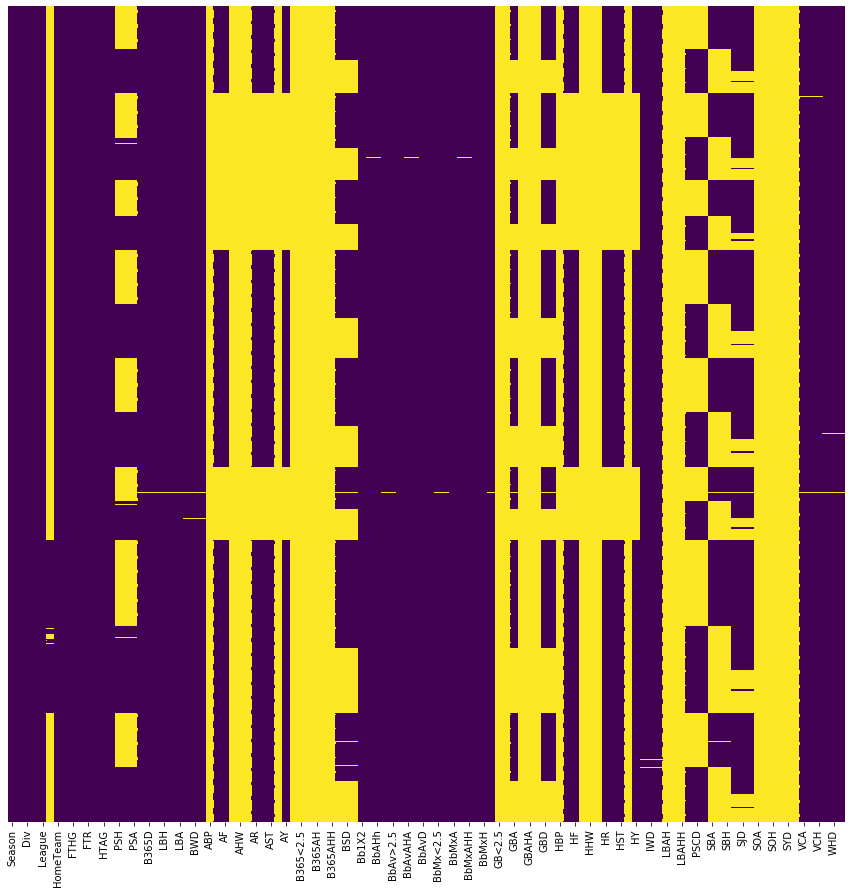

In [53]:
plt.figure(figsize=(15,15))
sns.heatmap(football_data_sorted.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [54]:
match_statistics = ['Attendance', 'Referee', 'HS', 'AS', 'HST', 'AST', 'HHW', 'AHW', 'HC', 'AC', 'HF',
                    'AF', 'HFKC','AFKC','HO','AO','HY' ,'AY', 'HR' ,'AR','HBP', 'ABP' ]

match_info = ['Season', 'Country', 'League', 'Div', 'Date' ,'HomeTeam','AwayTeam','FTHG','FTAG',
              'FTR','HTHG','HTAG','HTR']

relevant_columns = match_info + match_statistics

football_data_sorted = football_data_sorted[relevant_columns]

In [55]:
football_data_sorted.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22888 entries, 71798 to 24628
Data columns (total 35 columns):
Season        22888 non-null object
Country       22888 non-null object
League        22888 non-null object
Div           22888 non-null object
Date          22888 non-null object
HomeTeam      22888 non-null object
AwayTeam      22888 non-null object
FTHG          22888 non-null int64
FTAG          22888 non-null int64
FTR           22888 non-null object
HTHG          22888 non-null int64
HTAG          22888 non-null int64
HTR           22887 non-null object
Attendance    0 non-null float64
Referee       4636 non-null object
HS            16431 non-null float64
AS            16431 non-null float64
HST           16431 non-null float64
AST           16431 non-null float64
HHW           0 non-null float64
AHW           0 non-null float64
HC            16431 non-null float64
AC            16431 non-null float64
HF            16429 non-null float64
AF            16429 non-null f

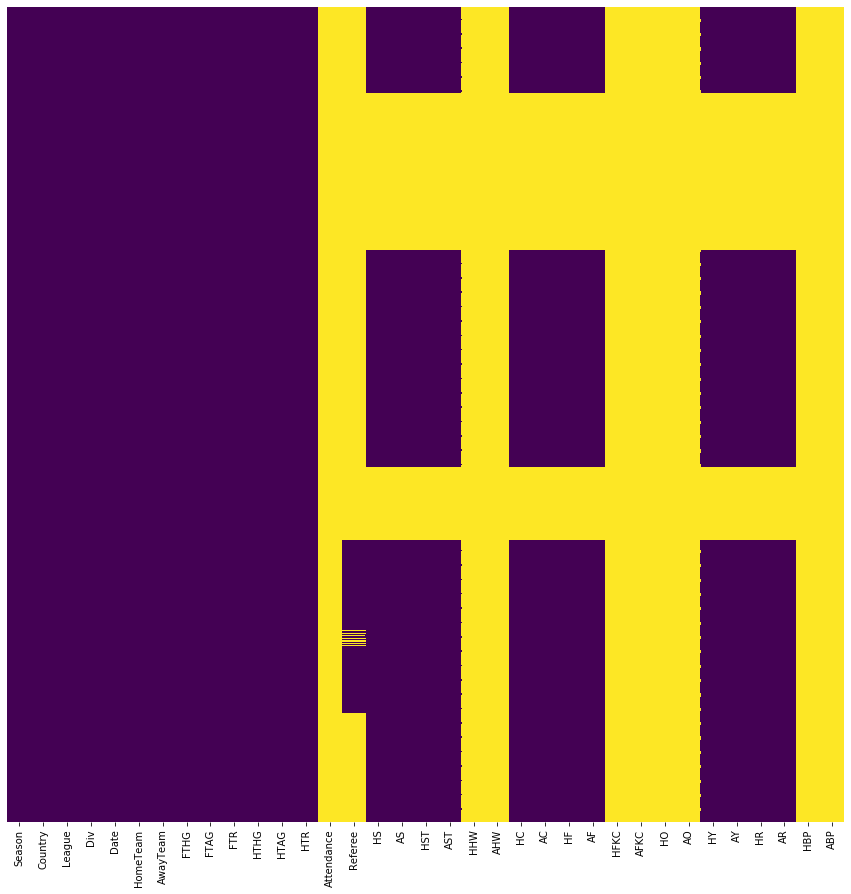

In [56]:
plt.figure(figsize=(15,15))
sns.heatmap(football_data_sorted.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [57]:
mask = football_data_sorted['HST'].isnull() | football_data_sorted['AST'].isnull()
                            
unuseful_matches = football_data_sorted[mask]

In [58]:
unuseful_matches.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6457 entries, 72021 to 47311
Data columns (total 35 columns):
Season        6457 non-null object
Country       6457 non-null object
League        6457 non-null object
Div           6457 non-null object
Date          6457 non-null object
HomeTeam      6457 non-null object
AwayTeam      6457 non-null object
FTHG          6457 non-null int64
FTAG          6457 non-null int64
FTR           6457 non-null object
HTHG          6457 non-null int64
HTAG          6457 non-null int64
HTR           6456 non-null object
Attendance    0 non-null float64
Referee       0 non-null object
HS            0 non-null float64
AS            0 non-null float64
HST           0 non-null float64
AST           0 non-null float64
HHW           0 non-null float64
AHW           0 non-null float64
HC            0 non-null float64
AC            0 non-null float64
HF            0 non-null float64
AF            0 non-null float64
HFKC          0 non-null float64
AFKC     

In [59]:
# Games per league, per match_season and per team
test_1 = unuseful_matches.groupby(['League', 'Season']).count()
test_1

Country  Div  Date  HomeTeam  AwayTeam  FTHG  FTAG  FTR  HTHG  HTAG  HTR  Attendance  Referee  HS  AS  HST  AST  HHW  AHW  HC  AC  HF  AF  HFKC  AFKC  HO  AO  HY  AY  HR  AR  HBP  ABP
League         Season                                                                                                                                                                                            
Eredivisie     2008/2009      306  306   306       306       306   306   306  306   306   306  306           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2009/2010      306  306   306       306       306   306   306  306   306   306  306           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2010/2011      306  306   306       306       306   306   306  306   306   306  306           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2011/2012      306  306   306       306       306   306   306  306   306   306  306           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2012/2013      306  306   306       306       306   306   306  306   306   306  306           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2013/2014      306  306   306       306       306   306   306  306   306   306  306           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2014/2015      306  306   306       306       306   306   306  306   306   306  306           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2015/2016      306  306   306       306       306   306   306  306   306   306  306           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
Jupiler League 2008/2009      306  306   306       306       306   306   306  306   306   306  306           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2009/2010      210  210   210       210       210   210   210  210   210   210  210           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2010/2011      240  240   240       240       240   240   240  240   240   240  240           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2011/2012      240  240   240       240       240   240   240  240   240   240  240           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2012/2013      240  240   240       240       240   240   240  240   240   240  240           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2013/2014      240  240   240       240       240   240   240  240   240   240  240           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2014/2015      240  240   240       240       240   240   240  240   240   240  240           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2015/2016      240  240   240       240       240   240   240  240   240   240  240           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
Liga I         2008/2009      240  240   240       240       240   240   240  240   240   240  240           0        0   0   0    0    0    0    0   0   0   0   0     0     0   0   0   0   0   0   0    0    0
               2009/2010      240  2

#### Useful observations gathered

Leagues that do not have useful match statistics from the football_data dataframe :

1. Belgium Jupiler League
2. Netherlands Eredivisie
3. Portugal Liga ZON Sagres

By having researched online resources (namely football-data.co.uk), the following leagues also do not have useful match statistics:

1. Poland Ekstraklasa
2. Switzerland Super League


Therefore, we are left with the following ***useful leagues*** to conduct analysis on:

1. England Premier League
2. France Ligue 1
3. Germany 1. Bundesliga
4. Italy Serie A
5. Scotland Premier League
6. Spain Liga BBVA






    

Let us only keep the matches in the useful leagues.

In [60]:
interesting_leagues = ['Premier League', 'Le Championnat', 'Bundesliga 1', 'Serie A', 'La Liga Primera Division']

football_data_sorted = football_data_sorted[football_data.League.isin(interesting_leagues)]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [61]:
football_data_sorted.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16432 entries, 71798 to 24628
Data columns (total 35 columns):
Season        16432 non-null object
Country       16432 non-null object
League        16432 non-null object
Div           16432 non-null object
Date          16432 non-null object
HomeTeam      16432 non-null object
AwayTeam      16432 non-null object
FTHG          16432 non-null int64
FTAG          16432 non-null int64
FTR           16432 non-null object
HTHG          16432 non-null int64
HTAG          16432 non-null int64
HTR           16431 non-null object
Attendance    0 non-null float64
Referee       4636 non-null object
HS            16431 non-null float64
AS            16431 non-null float64
HST           16431 non-null float64
AST           16431 non-null float64
HHW           0 non-null float64
AHW           0 non-null float64
HC            16431 non-null float64
AC            16431 non-null float64
HF            16429 non-null float64
AF            16429 non-null f

In [62]:
# Games per league, per match_season
test_2 = football_data_sorted.groupby(['League', 'Season']).count()
test_2

Country  Div  Date  HomeTeam  AwayTeam  FTHG  FTAG  FTR  HTHG  HTAG  HTR  Attendance  Referee   HS   AS  HST  AST  HHW  AHW   HC   AC   HF   AF  HFKC  AFKC  HO  AO   HY   AY   HR   AR  HBP  ABP
League                   Season                                                                                                                                                                                                      
Bundesliga 1             2008/2009      306  306   306       306       306   306   306  306   306   306  306           0        0  306  306  306  306    0    0  306  306  306  306     0     0   0   0  306  306  306  306    0    0
                         2009/2010      306  306   306       306       306   306   306  306   306   306  306           0        0  306  306  306  306    0    0  306  306  306  306     0     0   0   0  306  306  306  306    0    0
                         2010/2011      306  306   306       306       306   306   306  306   306   306  306           0        0  306  306  306  306    0    0  306  306  306  306     0     0   0   0  306  306  306  306    0    0
                         2011/2012      306  306   306       306       306   306   306  306   306   306  306           0        0  306  306  306  306    0    0  306  306  306  306     0     0   0   0  306  306  306  306    0    0
                         2012/2013      306  306   306       306       306   306   306  306   306   306  306           0        0  306  306  306  306    0    0  306  306  306  306     0     0   0   0  306  306  306  306    0    0
                         2013/2014      306  306   306       306       306   306   306  306   306   306  306           0        0  306  306  306  306    0    0  306  306  306  306     0     0   0   0  306  306  306  306    0    0
                         2014/2015      306  306   306       306       306   306   306  306   306   306  306           0        0  306  306  306  306    0    0  306  306  306  306     0     0   0   0  306  306  306  306    0    0
                         2015/2016      306  306   306       306       306   306   306  306   306   306  306           0        0  306  306  306  306    0    0  306  306  306  306     0     0   0   0  306  306  306  306    0    0
La Liga Primera Division 2008/2009      380  380   380       380       380   380   380  380   380   380  380           0        0  380  380  380  380    0    0  380  380  380  380     0     0   0   0  380  380  380  380    0    0
                         2009/2010      380  380   380       380       380   380   380  380   380   380  380           0        0  380  380  380  380    0    0  380  380  380  380     0     0   0   0  380  380  380  380    0    0
                         2010/2011      380  380   380       380       380   380   380  380   380   380  380           0        0  380  380  380  380    0    0  380  380  380  380     0     0   0   0  380  380  380  380    0    0
                         2011/2012      380  380   380       380       380   380   380  380   380   380  380           0        0  380  380  380  380    0    0  380  380  380  380     0     0   0   0  380  380  380  380    0    0
                         2012/2013      380  380   380       380       380   380   380  380   380   380  380           0        0  380  380  380  380    0    0  380  380  380  380     0     0   0   0  380  380  380  380    0    0
                         2013/2014      380  380   380       380       380   380   380  380   380   380  380           0        0  380  380  380  380    0    0  380  380  380  380     0     0   0   0  380  380  380  380    0    0
                         2014/2015      380  380   380       380       380   380   380  380   380   380  380           0        0  380  380  380  380    0    0  380  380  380  380     0     0   0   0  380  380  380  380    0    0
                         2015/2016      380  380   380       380       380   380   380  380   380   380  380           0      

In [63]:

#The column 'name' refers to the League

useful_leagues = ['England Premier League', 'France Ligue 1', 'Germany 1. Bundesliga', 'Italy Serie A',
                       'Scotland Premier League', 'Spain LIGA BBVA']

useful_matches = matches_clean[matches_clean.name.isin(useful_leagues)]


In [24]:
useful_matches.info(verbose = True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16409 entries, 1728 to 24556
Data columns (total 130 columns):
id                    16409 non-null int64
country_id            16409 non-null int64
league_id             16409 non-null int64
season                16409 non-null object
stage                 16409 non-null int64
date                  16409 non-null datetime64[ns]
match_api_id          16409 non-null int64
home_team_api_id      16409 non-null int64
away_team_api_id      16409 non-null int64
home_team_goal        16409 non-null int64
away_team_goal        16409 non-null int64
home_player_X1        16409 non-null float64
home_player_X2        16409 non-null float64
home_player_X3        16409 non-null float64
home_player_X4        16409 non-null float64
home_player_X5        16409 non-null float64
home_player_X6        16409 non-null float64
home_player_X7        16409 non-null float64
home_player_X8        16409 non-null float64
home_player_X9        16409 non-null float64

In [25]:
useful_matches = useful_matches.sort_values(by=['name', 'season'])

In [26]:
# Games per league, per match_season
games_played = useful_matches.groupby(['name', 'season']).count()
games_played

id  country_id  league_id  stage  date  match_api_id  home_team_api_id  away_team_api_id  home_team_goal  away_team_goal  home_player_X1  home_player_X2  home_player_X3  home_player_X4  home_player_X5  home_player_X6  home_player_X7  home_player_X8  home_player_X9  home_player_X10  home_player_X11  away_player_X1  away_player_X2  away_player_X3  away_player_X4  away_player_X5  away_player_X6  away_player_X7  away_player_X8  away_player_X9  away_player_X10  away_player_X11  home_player_Y1  home_player_Y2  home_player_Y3  home_player_Y4  home_player_Y5  home_player_Y6  home_player_Y7  home_player_Y8  home_player_Y9  home_player_Y10  home_player_Y11  away_player_Y1  away_player_Y2  away_player_Y3  away_player_Y4  away_player_Y5  away_player_Y6  away_player_Y7  away_player_Y8  away_player_Y9  away_player_Y10  away_player_Y11  home_player_1  home_player_2  home_player_3  home_player_4  home_player_5  home_player_6  home_player_7  home_player_8  home_player_9  home_player_10  home_player_11  away_player_1  away_player_2  away_player_3  away_player_4  away_player_5  away_player_6  away_player_7  away_player_8  away_player_9  away_player_10  away_player_11  goal  shoton  shotoff  foulcommit  card  cross  corner  possession  B365H  B365D  B365A  BWH  BWD  BWA  IWH  IWD  IWA  LBH  LBD  LBA  PSH  PSD  PSA  WHH  WHD  WHA  SJH  SJD  SJA  VCH  VCD  VCA  GBH  GBD  GBA  BSH  BSD  BSA  id.1  country_id.1  id.2  name.1  id.3  team_api_id  team_fifa_api_id  team_long_name  team_short_name  id.4  team_api_id.1  team_fifa_api_id.1  team_long_name.1  team_short_name.1
name                    season                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          
England Premier League  2008/2009  380         380        380    380   380           380               380               380             380             380             380             380             380             380             380             380             380             380             380              380              380             380             380             380             380             380             380             380             380             380              380              380             380             380             380             380             380             380             380             380             380              380              380             380             380             380             380             380             380             380             380

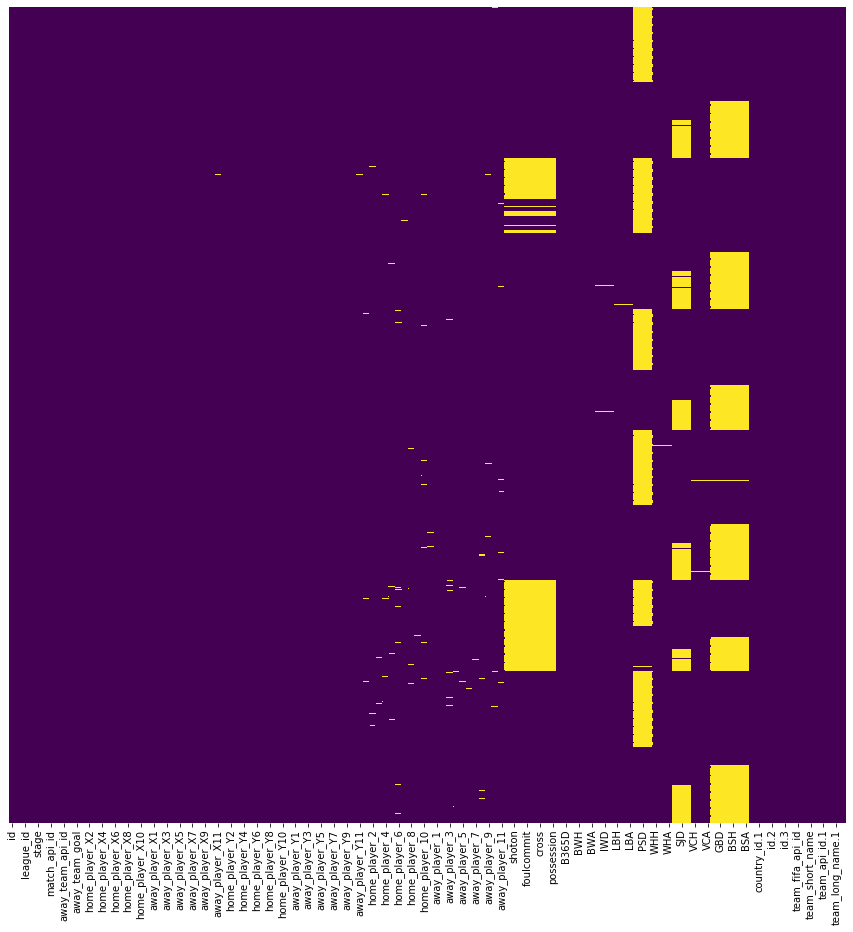

In [27]:
plt.figure(figsize=(15,15))
sns.heatmap(useful_matches.isnull(),yticklabels=False,cbar=False,cmap='viridis');

We need to know the players that played in each match, therefore let us drop the matches that do not contain the player id for all 22 players in that match.

In [28]:
home_players = ["home_player_" + str(x) for x in range(1, 12)]
away_players = ["away_player_" + str(x) for x in range(1, 12)]

players = home_players + away_players



In [29]:
#Drop the rows where we have missing data

very_clean_matches = useful_matches.dropna(subset=players)


In [30]:
# Games per league, per match_season
games_played = very_clean_matches.groupby(['name', 'season']).count()
games_played

id  country_id  league_id  stage  date  match_api_id  home_team_api_id  away_team_api_id  home_team_goal  away_team_goal  home_player_X1  home_player_X2  home_player_X3  home_player_X4  home_player_X5  home_player_X6  home_player_X7  home_player_X8  home_player_X9  home_player_X10  home_player_X11  away_player_X1  away_player_X2  away_player_X3  away_player_X4  away_player_X5  away_player_X6  away_player_X7  away_player_X8  away_player_X9  away_player_X10  away_player_X11  home_player_Y1  home_player_Y2  home_player_Y3  home_player_Y4  home_player_Y5  home_player_Y6  home_player_Y7  home_player_Y8  home_player_Y9  home_player_Y10  home_player_Y11  away_player_Y1  away_player_Y2  away_player_Y3  away_player_Y4  away_player_Y5  away_player_Y6  away_player_Y7  away_player_Y8  away_player_Y9  away_player_Y10  away_player_Y11  home_player_1  home_player_2  home_player_3  home_player_4  home_player_5  home_player_6  home_player_7  home_player_8  home_player_9  home_player_10  home_player_11  away_player_1  away_player_2  away_player_3  away_player_4  away_player_5  away_player_6  away_player_7  away_player_8  away_player_9  away_player_10  away_player_11  goal  shoton  shotoff  foulcommit  card  cross  corner  possession  B365H  B365D  B365A  BWH  BWD  BWA  IWH  IWD  IWA  LBH  LBD  LBA  PSH  PSD  PSA  WHH  WHD  WHA  SJH  SJD  SJA  VCH  VCD  VCA  GBH  GBD  GBA  BSH  BSD  BSA  id.1  country_id.1  id.2  name.1  id.3  team_api_id  team_fifa_api_id  team_long_name  team_short_name  id.4  team_api_id.1  team_fifa_api_id.1  team_long_name.1  team_short_name.1
name                    season                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          
England Premier League  2008/2009  348         348        348    348   348           348               348               348             348             348             348             348             348             348             348             348             348             348             348              348              348             348             348             348             348             348             348             348             348             348              348              348             348             348             348             348             348             348             348             348             348              348              348             348             348             348             348             348             348             348             348

Let us keep the German League as it has the most complete rich data-set compared to all other leagues.

In [31]:
bundesliga = useful_matches[useful_matches['name'] == 'Germany 1. Bundesliga']

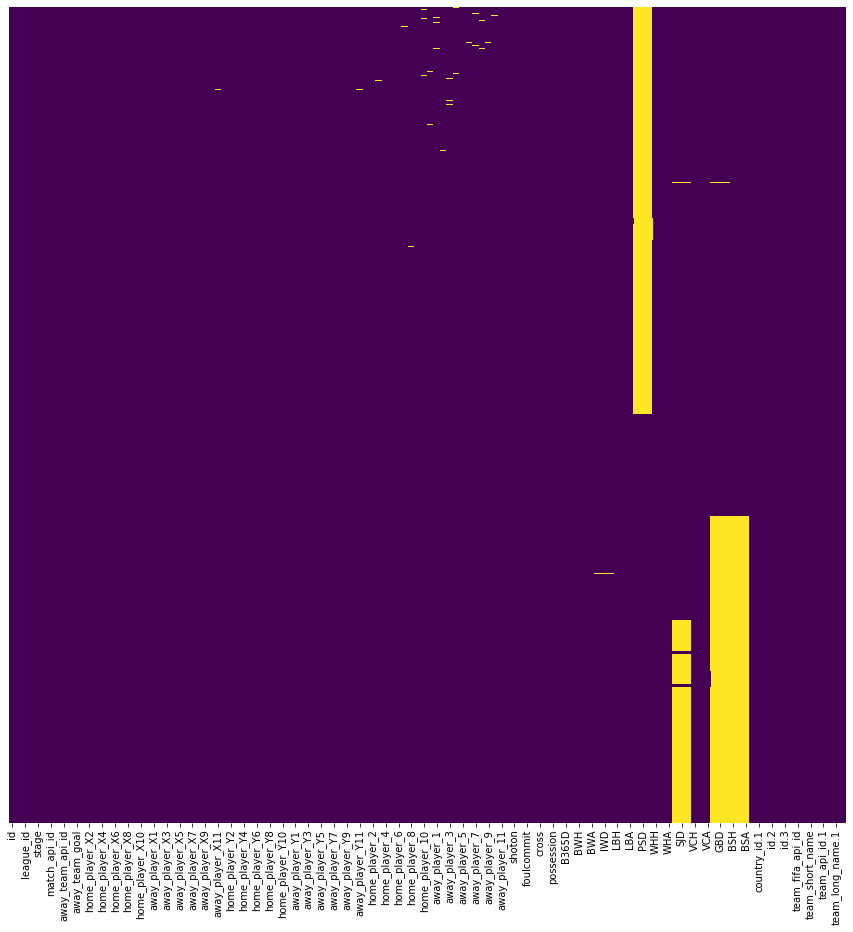

In [32]:
plt.figure(figsize=(15,15))
sns.heatmap(bundesliga.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [64]:
bundesliga_stats = football_data_sorted[football_data_sorted['League'] == 'Bundesliga 1']

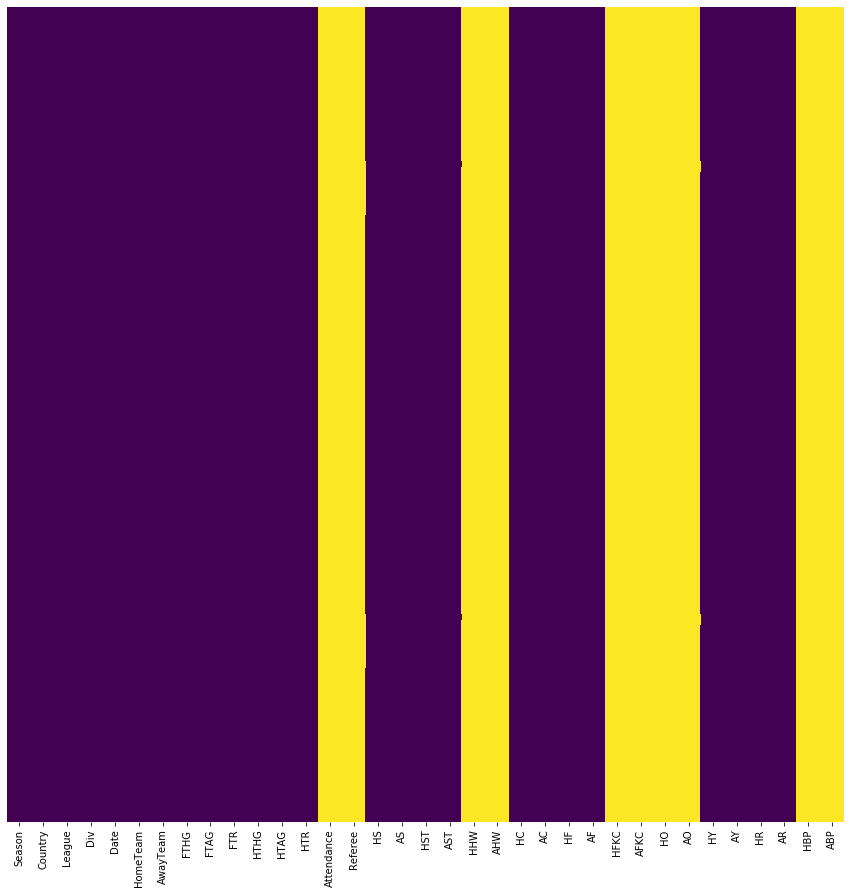

In [65]:
plt.figure(figsize=(15,15))
sns.heatmap(bundesliga_stats.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [34]:
bundesliga.head()

,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,goal,shoton,shotoff,foulcommit,card,cross,corner,possession,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,name,id.2,name.1,id.3,team_api_id,team_fifa_api_id,team_long_name,team_short_name,id.4,team_api_id.1,team_fifa_api_id.1,team_long_name.1,team_short_name.1
7808,7809,7809,7809,2008/2009,1,2008-08-15,499317,9823,9790,2,2,1.0,2.0,4.0,6.0,8.0,5.0,4.0,6.0,5.0,4.0,6.0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,3.0,5.0,7.0,1.0,3.0,3.0,3.0,3.0,5.0,7.0,7.0,9.0,11.0,11.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,10.0,10.0,10.0,27284.0,35988.0,39774.0,33085.0,30894.0,38244.0,30872.0,38843.0,95078.0,30638.0,32118.0,25524.0,36183.0,27293.0,37787.0,37156.0,30749.0,30598.0,39106.0,38216.0,33101.0,30764.0,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,1.57,3.8,6.0,1.55,3.70,5.45,1.6,3.6,4.8,1.53,3.50,5.50,NaN,NaN,NaN,1.53,3.5,5.5,1.62,3.40,5.50,1.55,3.50,5.50,1.60,3.60,5.75,1.53,3.75,5.50,7809,7809,Germany 1. Bundesliga,7809,Germany,15617,9823,21.0,FC Bayern Munich,BMU,15618,9790,28.0,Hamburger SV,HAM
7809,7810,7809,7809,2008/2009,1,2008-08-16,499318,8178,9789,2,3,1.0,2.0,4.0,6.0,8.0,5.0,3.0,5.0,7.0,4.0,6.0,1.0,2.0,4.0,6.0,8.0,2.0,4.0,6.0,8.0,4.0,6.0,1.0,3.0,3.0,3.0,3.0,5.0,7.0,7.0,7.0,10.0,10.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,7.0,10.0,10.0,36147.0,27427.0,27492.0,128037.0,28081.0,27429.0,34681.0,49939.0,30937.0,27556.0,31199.0,27358.0,79737.0,71399.0,36388.0,27360.0,43319.0,36132.0,30707.0,27363.0,31718.0,27514.0,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,2.05,3.3,3.6,2.05,3.25,3.30,2.0,3.3,3.2,1.91,3.25,3.40,NaN,NaN,NaN,1.95,3.1,3.5,1.91,3.25,3.75,2.00,3.25,3.25,2.05,3.30,3.50,2.00,3.25,3.40,7809,7809,Germany 1. Bundesliga,7809,Germany,15619,8178,32.0,Bayer 04 Leverkusen,LEV,15620,9789,22.0,Borussia Dortmund,DOR
7810,7811,7809,7809,2008/2009,1,2008-08-16,499319,10189,9904,3,0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,4.0,6.0,5.0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,5.0,4.0,6.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,6.0,8.0,8.0,11.0,1.0,3.0,3.0,3.0,3.0,5.0,5.0,5.0,8.0,10.0,10.0,37322.0,27461.0,68253.0,27301.0,30250.0,30251.0,27483.0,27307.0,35997.0,25773.0,30249.0,27341.0,30811.0,27286.0,NaN,25483.0,27351.0,27349.0,39045.0,34400.0,30854.0,39840.0,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,1.57,3.8,6.0,1.60,3.65,5.00,1.6,3.6,4.8,1.57,3.50,5.00,NaN,NaN,NaN,1.60,3.4,4.8,1.62,3.40,5.50,1.50,3.60,6.00,1.60,3.60,5.60,1.57,3.75,5.00,7809,7809,Germany 1. Bundesliga,7809,Germany,15621,10189,34.0,FC Schalke 04,S04,15622,9904,485.0,Hannov

Let us create an intermediary table to ensure that we have unique keys on the home-team and away-tame that are consistent between the two tables.

In [35]:
id_team_home = bundesliga[['home_team_api_id', 'team_long_name']].copy()

id_team_home.rename(columns={'home_team_api_id': 'api_id'}, inplace=True)
id_team_home.rename(columns={'team_long_name': 'team_name'}, inplace=True)


id_team_away = bundesliga[['away_team_api_id', 'team_long_name.1']].copy()

id_team_away.rename(columns={'away_team_api_id': 'api_id'}, inplace=True)
id_team_away.rename(columns={'team_long_name.1': 'team_name'}, inplace=True)



id_team = pd.concat([id_team_home, id_team_away], ignore_index=True)

In [36]:
id_team.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4896 entries, 0 to 4895
Data columns (total 2 columns):
api_id       4896 non-null int64
team_name    4896 non-null object
dtypes: int64(1), object(1)
memory usage: 76.6+ KB


In [37]:
print(any(id_team['team_name'].duplicated())) 

True


In [38]:
id_team = id_team.drop_duplicates(subset = 'team_name', keep = 'first')

In [39]:
id_team.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30 entries, 0 to 2158
Data columns (total 2 columns):
api_id       30 non-null int64
team_name    30 non-null object
dtypes: int64(1), object(1)
memory usage: 720.0+ bytes


In [40]:
id_team.team_name.values

array(['FC Bayern Munich', 'Bayer 04 Leverkusen', 'FC Schalke 04',
       'VfL Wolfsburg', 'Eintracht Frankfurt', 'DSC Arminia Bielefeld',
       'FC Energie Cottbus', 'Borussia Mönchengladbach', 'Karlsruher SC',
       'Hamburger SV', 'SV Werder Bremen', 'Hertha BSC Berlin',
       '1. FC Köln', 'VfL Bochum', 'Borussia Dortmund', 'VfB Stuttgart',
       'Hannover 96', 'TSG 1899 Hoffenheim', 'SC Freiburg',
       '1. FC Nürnberg', '1. FSV Mainz 05', '1. FC Kaiserslautern',
       'FC St. Pauli', 'FC Augsburg', 'SpVgg Greuther Fürth',
       'Fortuna Düsseldorf', 'Eintracht Braunschweig', 'SC Paderborn 07',
       'SV Darmstadt 98', 'FC Ingolstadt 04'], dtype=object)

In [66]:
bundesliga_stats.HomeTeam.unique()

array(['Bayern Munich', 'Bielefeld', 'Cottbus', 'Ein Frankfurt',
       'FC Koln', 'Karlsruhe', "M'gladbach", 'Schalke 04', 'Wolfsburg',
       'Werder Bremen', 'Stuttgart', 'Hoffenheim', 'Hertha', 'Hannover',
       'Hamburg', 'Dortmund', 'Bochum', 'Leverkusen', 'Freiburg', 'Mainz',
       'Nurnberg', 'Kaiserslautern', 'St Pauli', 'Augsburg',
       'Greuther Furth', 'Fortuna Dusseldorf', 'Braunschweig',
       'Paderborn', 'Darmstadt', 'Ingolstadt'], dtype=object)

Names do not exactly match so we need to use a fuzzy-match algorithm to do the consistent name-checks for us.

In [67]:
# pip install fuzzywuzzy
from fuzzywuzzy import fuzz
from fuzzywuzzy import process

def match_name(name, list_names, min_score=0):
    # -1 score incase we don't get any matches
    max_score = -1
    # Returning empty name for no match as well
    max_name = ""
    
    
    ratio_tuples_list = []
    ratio_scores_list = []
    
    #Extracting the best score from each algorithm in the fuzzy wuzzy library in the lines below
    
    #Returns tuple with match and best score i.e. Apple Inc , 89
    simple_ratio_best_match = process.extractOne(name, list_names, scorer= fuzz.ratio )
    
    #Returns tuple with match and best score i.e. Apple. , 94
    partial_ratio_best_match = process.extractOne(name, list_names, scorer= fuzz.partial_ratio )
    
    token_sort_ratio_best_match = process.extractOne(name, list_names, scorer= fuzz.token_sort_ratio)
    
    token_set_ratio_best_match = process.extractOne(name, list_names, scorer= fuzz.token_set_ratio )
    
    quick_ratio_best_match = process.extractOne(name, list_names, scorer= fuzz.QRatio)
    
    unicodequick_ratio_best_match = process.extractOne(name, list_names, scorer = fuzz.UQRatio)
    
    weighted_ratio_best_match = process.extractOne(name, list_names, scorer = fuzz.WRatio)
    
    unicodeweighted_ratio_best_match = process.extractOne(name, list_names, scorer = fuzz.UWRatio)
    
    ratio_tuples_list = [simple_ratio_best_match, partial_ratio_best_match, token_sort_ratio_best_match,
                            token_set_ratio_best_match, quick_ratio_best_match, unicodequick_ratio_best_match,
                            weighted_ratio_best_match, unicodeweighted_ratio_best_match]
    
    
    ratio_scores_list = []
    
    for ratio_tuple_item in ratio_tuples_list:
        #Store the numerical score from each tuple item: (name, score)
        ratio_scores_list.append(ratio_tuple_item[1])
    
    best_score = max(ratio_scores_list)
    
    best_score_position = ratio_scores_list.index(best_score)
    best_match = ratio_tuples_list[best_score_position][0] 
    
            
    return (ratio_tuples_list, best_score, best_match)

In [68]:
query_result = id_team.query("team_name=='VfL Wolfsburg'")

query_result

,api_id,team_name
3,8721,VfL Wolfsburg


In [69]:
result = id_team[id_team['team_name'] == 'VfL Wolfsburg']


In [70]:
result.iloc[0]['api_id']

8721

In [71]:
# List for dicts for easy dataframe creation
dict_list = []

# iterating over our players in the interesting_matches dataframe
for name in bundesliga_stats.HomeTeam.unique():
    # Use our method to find best match, we can set a threshold here
    match, best_score, best_match = match_name(name, id_team.team_name, 50)
    
    #Select the correct ID from the table id_team
    result = id_team[id_team['team_name'] == best_match]
    best_match_id = result.iloc[0]['api_id']
    
    # New dict for storing data
    dict_ = {}
    dict_.update({"Unmatched_name" : name})
    dict_.update({"Best_score" : best_score})
    dict_.update({"Best_match" : best_match})
    dict_.update({"Best_match_id" : best_match_id})
    
    
    dict_.update({"Simple Ratio Name" : match[0][0]})
    dict_.update({"Simple Ratio Score" : match[0][1]})
    dict_.update({"Simple Ratio ID" : match[0][2]})
    
    dict_.update({"Partial Ratio Name" : match[1][0]})
    dict_.update({"Partial Ratio Score" : match[1][1]})
    dict_.update({"Partial Ratio ID" : match[1][2]})
    
    dict_.update({"Token Sort Ratio Name" : match[2][0]})
    dict_.update({"Token Sort Ratio Score" : match[2][1]})
    dict_.update({"Token Sort Ratio ID" : match[2][2]})
    
    dict_.update({"Token Set Ratio Name" : match[3][0]})
    dict_.update({"Token Set Ratio Score" : match[3][1]})
    dict_.update({"Token Set Ratio ID" : match[3][2]})
    
    dict_.update({"Quick Ratio Name" : match[4][0]})
    dict_.update({"Quick Set Ratio Score" : match[4][1]})
    dict_.update({"Quick Set Ratio ID" : match[4][2]})
    
    dict_.update({"Unicode Quick Ratio Name" : match[5][0]})
    dict_.update({"Unicode Quick Ratio Score" : match[5][1]})
    dict_.update({"Unicode Quick Ratio ID" : match[5][2]})
    
    dict_.update({"Weighted Ratio Name" : match[6][0]})
    dict_.update({"Weighted Ratio Score" : match[6][1]})
    dict_.update({"Weighted Ratio ID" : match[6][2]})

    dict_.update({"Unicode Weighted Ratio Name" : match[7][0]})
    dict_.update({"Unicode Weighted Ratio Score" : match[7][1]})
    dict_.update({"Unicode Weighted Ratio ID" : match[7][2]})
    
    #dict_.update({"tuples" : match})
    #dict_.update({"score" : best_score})
    dict_list.append(dict_)
    
merge_table = pd.DataFrame(dict_list)


# Save results


merge_table.to_csv("comparison_table", index=False)

merge_table.to_excel("comparison_table_excel.xlsx")  # doctest: +SKIP

Compute Merge on Home Team

In [72]:
merge_table.head()

,Best_match,Best_match_id,Best_score,Partial Ratio ID,Partial Ratio Name,Partial Ratio Score,Quick Ratio Name,Quick Set Ratio ID,Quick Set Ratio Score,Simple Ratio ID,Simple Ratio Name,Simple Ratio Score,Token Set Ratio ID,Token Set Ratio Name,Token Set Ratio Score,Token Sort Ratio ID,Token Sort Ratio Name,Token Sort Ratio Score,Unicode Quick Ratio ID,Unicode Quick Ratio Name,Unicode Quick Ratio Score,Unicode Weighted Ratio ID,Unicode Weighted Ratio Name,Unicode Weighted Ratio Score,Unmatched_name,Weighted Ratio ID,Weighted Ratio Name,Weighted Ratio Score
0,FC Bayern Munich,9823,100,0,FC Bayern Munich,100,FC Bayern Munich,0,90,0,FC Bayern Munich,90,0,FC Bayern Munich,100,0,FC Bayern Munich,90,0,FC Bayern Munich,90,0,FC Bayern Munich,95,Bayern Munich,0,FC Bayern Munich,95
1,DSC Arminia Bielefeld,9912,100,5,DSC Arminia Bielefeld,100,DSC Arminia Bielefeld,5,60,5,DSC Arminia Bielefeld,60,5,DSC Arminia Bielefeld,100,5,DSC Arminia Bielefeld,60,5,DSC Arminia Bielefeld,60,5,DSC Arminia Bielefeld,90,Bielefeld,5,DSC Arminia Bielefeld,90
2,FC Energie Cottbus,8398,100,6,FC Energie Cottbus,100,FC Energie Cottbus,6,56,6,FC Energie Cottbus,56,6,FC Energie Cottbus,100,6,FC Energie Cottbus,56,6,FC Energie Cottbus,56,6,FC Energie Cottbus,90,Cottbus,6,FC Energie Cottbus,90
3,Eintracht Frankfurt,9810,82,4,Eintracht Frankfurt,77,Eintracht Frankfurt,4,81,4,Eintracht Frankfurt,81,4,Eintracht Frankfurt,82,4,Eintracht Frankfurt,81,4,Eintracht Frankfurt,81,4,Eintracht Frankfurt,81,Ein Frankfurt,4,Eintracht Frankfurt,81
4,1. FC Köln,8722,86,15,1. FC Köln,86,1. FC Köln,15,75,15,1. FC Köln,71,15,1. FC Köln,80,15,1. FC Köln,80,15,1. FC Köln,71,0,FC Bayern Munich,86,FC Koln,0,FC Bayern Munich,86


In [73]:
merge_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 28 columns):
Best_match                      30 non-null object
Best_match_id                   30 non-null int64
Best_score                      30 non-null int64
Partial Ratio ID                30 non-null int64
Partial Ratio Name              30 non-null object
Partial Ratio Score             30 non-null int64
Quick Ratio Name                30 non-null object
Quick Set Ratio ID              30 non-null int64
Quick Set Ratio Score           30 non-null int64
Simple Ratio ID                 30 non-null int64
Simple Ratio Name               30 non-null object
Simple Ratio Score              30 non-null int64
Token Set Ratio ID              30 non-null int64
Token Set Ratio Name            30 non-null object
Token Set Ratio Score           30 non-null int64
Token Sort Ratio ID             30 non-null int64
Token Sort Ratio Name           30 non-null object
Token Sort Ratio Score          30 non-nu

In [74]:
columns_to_keep = ['Unmatched_name', 'Best_match_id']

auxiliary_table = merge_table[columns_to_keep]

In [75]:
auxiliary_table.head()

,Unmatched_name,Best_match_id
0,Bayern Munich,9823
1,Bielefeld,9912
2,Cottbus,8398
3,Ein Frankfurt,9810
4,FC Koln,8722


In [76]:
bundesliga_stats.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2448 entries, 71798 to 24887
Data columns (total 35 columns):
Season        2448 non-null object
Country       2448 non-null object
League        2448 non-null object
Div           2448 non-null object
Date          2448 non-null object
HomeTeam      2448 non-null object
AwayTeam      2448 non-null object
FTHG          2448 non-null int64
FTAG          2448 non-null int64
FTR           2448 non-null object
HTHG          2448 non-null int64
HTAG          2448 non-null int64
HTR           2448 non-null object
Attendance    0 non-null float64
Referee       0 non-null object
HS            2448 non-null float64
AS            2448 non-null float64
HST           2448 non-null float64
AST           2448 non-null float64
HHW           0 non-null float64
AHW           0 non-null float64
HC            2448 non-null float64
AC            2448 non-null float64
HF            2448 non-null float64
AF            2448 non-null float64
HFKC          0 no

In [77]:
bundesliga_stats = bundesliga_stats.reset_index(drop=True)

In [78]:
bundesliga_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2448 entries, 0 to 2447
Data columns (total 35 columns):
Season        2448 non-null object
Country       2448 non-null object
League        2448 non-null object
Div           2448 non-null object
Date          2448 non-null object
HomeTeam      2448 non-null object
AwayTeam      2448 non-null object
FTHG          2448 non-null int64
FTAG          2448 non-null int64
FTR           2448 non-null object
HTHG          2448 non-null int64
HTAG          2448 non-null int64
HTR           2448 non-null object
Attendance    0 non-null float64
Referee       0 non-null object
HS            2448 non-null float64
AS            2448 non-null float64
HST           2448 non-null float64
AST           2448 non-null float64
HHW           0 non-null float64
AHW           0 non-null float64
HC            2448 non-null float64
AC            2448 non-null float64
HF            2448 non-null float64
AF            2448 non-null float64
HFKC          0 non-nul

In [79]:
bundesliga_stats.head()

,Season,Country,League,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Attendance,Referee,HS,AS,HST,AST,HHW,AHW,HC,AC,HF,AF,HFKC,AFKC,HO,AO,HY,AY,HR,AR,HBP,ABP
0,2008/2009,Germany,Bundesliga 1,D1,2009-05-23 00:00:00,Bayern Munich,Stuttgart,2,1,H,1,0,H,NaN,NaN,14.0,9.0,4.0,5.0,NaN,NaN,5.0,4.0,19.0,21.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,NaN,NaN
1,2008/2009,Germany,Bundesliga 1,D1,2009-05-23 00:00:00,Bielefeld,Hannover,2,2,D,1,0,H,NaN,NaN,17.0,17.0,6.0,8.0,NaN,NaN,10.0,7.0,11.0,16.0,NaN,NaN,NaN,NaN,2.0,0.0,0.0,0.0,NaN,NaN
2,2008/2009,Germany,Bundesliga 1,D1,2009-05-23 00:00:00,Cottbus,Leverkusen,3,0,H,0,0,D,NaN,NaN,11.0,18.0,6.0,9.0,NaN,NaN,3.0,8.0,18.0,13.0,NaN,NaN,NaN,NaN,1.0,3.0,0.0,1.0,NaN,NaN
3,2008/2009,Germany,Bundesliga 1,D1,2009-05-23 00:00:00,Ein Frankfurt,Hamburg,2,3,A,0,1,A,NaN,NaN,9.0,15.0,4.0,5.0,NaN,NaN,6.0,8.0,20.0,25.0,NaN,NaN,NaN,NaN,4.0,5.0,0.0,0.0,NaN,NaN
4,2008/2009,Germany,Bundesliga 1,D1,2009-05-23 00:00:00,FC Koln,Bochum,1,1,D,1,1,D,NaN,NaN,20.0,15.0,8.0,4.0,NaN,NaN,7.0,5.0,18.0,10.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,NaN,NaN


In [80]:
auxiliary_table.rename(columns={'Unmatched_name': 'HomeTeam'}, inplace=True)

auxiliary_table.head()

/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


,HomeTeam,Best_match_id
0,Bayern Munich,9823
1,Bielefeld,9912
2,Cottbus,8398
3,Ein Frankfurt,9810
4,FC Koln,8722


In [81]:
new_df = pd.merge(bundesliga_stats, auxiliary_table, on = 'HomeTeam')

In [82]:
new_df.tail()

,Season,Country,League,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Attendance,Referee,HS,AS,HST,AST,HHW,AHW,HC,AC,HF,AF,HFKC,AFKC,HO,AO,HY,AY,HR,AR,HBP,ABP,Best_match_id
2443,2015/2016,Germany,Bundesliga 1,D1,2015-10-24 00:00:00,Ingolstadt,Hertha,0,1,A,0,1,A,NaN,NaN,18.0,5.0,3.0,1.0,NaN,NaN,8.0,2.0,12.0,12.0,NaN,NaN,NaN,NaN,2.0,3.0,0.0,0.0,NaN,NaN,8234
2444,2015/2016,Germany,Bundesliga 1,D1,2015-10-03 00:00:00,Ingolstadt,Ein Frankfurt,2,0,H,0,0,D,NaN,NaN,14.0,12.0,4.0,2.0,NaN,NaN,4.0,3.0,11.0,11.0,NaN,NaN,NaN,NaN,1.0,2.0,0.0,0.0,NaN,NaN,8234
2445,2015/2016,Germany,Bundesliga 1,D1,2015-09-22 00:00:00,Ingolstadt,Hamburg,0,1,A,0,0,D,NaN,NaN,12.0,8.0,1.0,3.0,NaN,NaN,8.0,5.0,15.0,16.0,NaN,NaN,NaN,NaN,2.0,1.0,0.0,0.0,NaN,NaN,8234
2446,2015/2016,Germany,Bundesliga 1,D1,2015-09-12 00:00:00,Ingolstadt,Wolfsburg,0,0,D,0,0,D,NaN,NaN,5.0,17.0,1.0,3.0,NaN,NaN,2.0,5.0,10.0,15.0,NaN,NaN,NaN,NaN,2.0,3.0,0.0,0.0,NaN,NaN,8234
2447,2015/2016,Germany,Bundesliga 1,D1,2015-08-23 00:00:00,Ingolstadt,Dortmund,0,4,A,0,0,D,NaN,NaN,3.0,18.0,2.0,8.0,NaN,NaN,1.0,4.0,18.0,16.0,NaN,NaN,NaN,NaN,2.0,3.0,0.0,0.0,NaN,NaN,8234


In [83]:
auxiliary_table.rename(columns={'HomeTeam': 'AwayTeam'}, inplace=True)

auxiliary_table.head()

,AwayTeam,Best_match_id
0,Bayern Munich,9823
1,Bielefeld,9912
2,Cottbus,8398
3,Ein Frankfurt,9810
4,FC Koln,8722


In [84]:
new_df.rename(columns={'Best_match_id': 'home_team_api_id'}, inplace=True)

new_df.head()

,Season,Country,League,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Attendance,Referee,HS,AS,HST,AST,HHW,AHW,HC,AC,HF,AF,HFKC,AFKC,HO,AO,HY,AY,HR,AR,HBP,ABP,home_team_api_id
0,2008/2009,Germany,Bundesliga 1,D1,2009-05-23 00:00:00,Bayern Munich,Stuttgart,2,1,H,1,0,H,NaN,NaN,14.0,9.0,4.0,5.0,NaN,NaN,5.0,4.0,19.0,21.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,NaN,NaN,9823
1,2008/2009,Germany,Bundesliga 1,D1,2009-05-12 00:00:00,Bayern Munich,Leverkusen,3,0,H,0,0,D,NaN,NaN,19.0,9.0,9.0,3.0,NaN,NaN,9.0,3.0,17.0,15.0,NaN,NaN,NaN,NaN,1.0,5.0,0.0,0.0,NaN,NaN,9823
2,2008/2009,Germany,Bundesliga 1,D1,2009-05-02 00:00:00,Bayern Munich,M'gladbach,2,1,H,2,1,H,NaN,NaN,15.0,7.0,5.0,2.0,NaN,NaN,6.0,2.0,15.0,19.0,NaN,NaN,NaN,NaN,0.0,3.0,0.0,0.0,NaN,NaN,9823
3,2008/2009,Germany,Bundesliga 1,D1,2009-04-25 00:00:00,Bayern Munich,Schalke 04,0,1,A,0,1,A,NaN,NaN,22.0,8.0,6.0,4.0,NaN,NaN,15.0,5.0,16.0,15.0,NaN,NaN,NaN,NaN,2.0,3.0,1.0,1.0,NaN,NaN,9823
4,2008/2009,Germany,Bundesliga 1,D1,2009-04-11 00:00:00,Bayern Munich,Ein Frankfurt,4,0,H,3,0,H,NaN,NaN,15.0,7.0,6.0,1.0,NaN,NaN,5.0,3.0,18.0,16.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,NaN,NaN,9823


In [85]:
new_df = pd.merge(new_df, auxiliary_table, on = 'AwayTeam')

In [86]:
new_df.head()

,Season,Country,League,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Attendance,Referee,HS,AS,HST,AST,HHW,AHW,HC,AC,HF,AF,HFKC,AFKC,HO,AO,HY,AY,HR,AR,HBP,ABP,home_team_api_id,Best_match_id
0,2008/2009,Germany,Bundesliga 1,D1,2009-05-23 00:00:00,Bayern Munich,Stuttgart,2,1,H,1,0,H,NaN,NaN,14.0,9.0,4.0,5.0,NaN,NaN,5.0,4.0,19.0,21.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,NaN,NaN,9823,10269
1,2009/2010,Germany,Bundesliga 1,D1,2010-03-27 00:00:00,Bayern Munich,Stuttgart,1,2,A,1,1,D,NaN,NaN,9.0,15.0,3.0,8.0,NaN,NaN,5.0,2.0,16.0,23.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,NaN,NaN,9823,10269
2,2010/2011,Germany,Bundesliga 1,D1,2011-05-14 00:00:00,Bayern Munich,Stuttgart,2,1,H,1,1,D,NaN,NaN,10.0,10.0,5.0,5.0,NaN,NaN,6.0,4.0,17.0,21.0,NaN,NaN,NaN,NaN,2.0,2.0,0.0,0.0,NaN,NaN,9823,10269
3,2011/2012,Germany,Bundesliga 1,D1,2012-04-28 00:00:00,Bayern Munich,Stuttgart,2,0,H,1,0,H,NaN,NaN,15.0,9.0,6.0,5.0,NaN,NaN,6.0,6.0,12.0,14.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,NaN,NaN,9823,10269
4,2012/2013,Germany,Bundesliga 1,D1,2012-09-02 00:00:00,Bayern Munich,Stuttgart,6,1,H,3,1,H,NaN,NaN,16.0,7.0,13.0,4.0,NaN,NaN,5.0,3.0,13.0,8.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,1.0,NaN,NaN,9823,10269


In [87]:
new_df.rename(columns={'Best_match_id': 'away_team_api_id'}, inplace=True)

In [88]:
new_df.rename(columns={'Date': 'date'}, inplace=True)

Check to see that we have the same columns to perform a merge on below.

In [89]:
all_columns = pd.Series(list(bundesliga) + list(new_df))
all_columns[all_columns.duplicated()]

134                date
165    home_team_api_id
166    away_team_api_id
dtype: object

In [90]:
#Column 'date' is currently a string, convert to datetime format
new_df['date'] = pd.to_datetime(new_df['date'])

In [91]:
bundesliga.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2448 entries, 7808 to 10255
Data columns (total 130 columns):
id                    int64
country_id            int64
league_id             int64
season                object
stage                 int64
date                  datetime64[ns]
match_api_id          int64
home_team_api_id      int64
away_team_api_id      int64
home_team_goal        int64
away_team_goal        int64
home_player_X1        float64
home_player_X2        float64
home_player_X3        float64
home_player_X4        float64
home_player_X5        float64
home_player_X6        float64
home_player_X7        float64
home_player_X8        float64
home_player_X9        float64
home_player_X10       float64
home_player_X11       float64
away_player_X1        float64
away_player_X2        float64
away_player_X3        float64
away_player_X4        float64
away_player_X5        float64
away_player_X6        float64
away_player_X7        float64
away_player_X8        float64


In [92]:
new_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2448 entries, 0 to 2447
Data columns (total 37 columns):
Season              2448 non-null object
Country             2448 non-null object
League              2448 non-null object
Div                 2448 non-null object
date                2448 non-null datetime64[ns]
HomeTeam            2448 non-null object
AwayTeam            2448 non-null object
FTHG                2448 non-null int64
FTAG                2448 non-null int64
FTR                 2448 non-null object
HTHG                2448 non-null int64
HTAG                2448 non-null int64
HTR                 2448 non-null object
Attendance          0 non-null float64
Referee             0 non-null object
HS                  2448 non-null float64
AS                  2448 non-null float64
HST                 2448 non-null float64
AST                 2448 non-null float64
HHW                 0 non-null float64
AHW                 0 non-null float64
HC                  2448 non-null

In [93]:
bundesliga.head()

,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,goal,shoton,shotoff,foulcommit,card,cross,corner,possession,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,name,id.2,name.1,id.3,team_api_id,team_fifa_api_id,team_long_name,team_short_name,id.4,team_api_id.1,team_fifa_api_id.1,team_long_name.1,team_short_name.1
7808,7809,7809,7809,2008/2009,1,2008-08-15,499317,9823,9790,2,2,1.0,2.0,4.0,6.0,8.0,5.0,4.0,6.0,5.0,4.0,6.0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,3.0,5.0,7.0,1.0,3.0,3.0,3.0,3.0,5.0,7.0,7.0,9.0,11.0,11.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,10.0,10.0,10.0,27284.0,35988.0,39774.0,33085.0,30894.0,38244.0,30872.0,38843.0,95078.0,30638.0,32118.0,25524.0,36183.0,27293.0,37787.0,37156.0,30749.0,30598.0,39106.0,38216.0,33101.0,30764.0,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,1.57,3.8,6.0,1.55,3.70,5.45,1.6,3.6,4.8,1.53,3.50,5.50,NaN,NaN,NaN,1.53,3.5,5.5,1.62,3.40,5.50,1.55,3.50,5.50,1.60,3.60,5.75,1.53,3.75,5.50,7809,7809,Germany 1. Bundesliga,7809,Germany,15617,9823,21.0,FC Bayern Munich,BMU,15618,9790,28.0,Hamburger SV,HAM
7809,7810,7809,7809,2008/2009,1,2008-08-16,499318,8178,9789,2,3,1.0,2.0,4.0,6.0,8.0,5.0,3.0,5.0,7.0,4.0,6.0,1.0,2.0,4.0,6.0,8.0,2.0,4.0,6.0,8.0,4.0,6.0,1.0,3.0,3.0,3.0,3.0,5.0,7.0,7.0,7.0,10.0,10.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,7.0,10.0,10.0,36147.0,27427.0,27492.0,128037.0,28081.0,27429.0,34681.0,49939.0,30937.0,27556.0,31199.0,27358.0,79737.0,71399.0,36388.0,27360.0,43319.0,36132.0,30707.0,27363.0,31718.0,27514.0,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,2.05,3.3,3.6,2.05,3.25,3.30,2.0,3.3,3.2,1.91,3.25,3.40,NaN,NaN,NaN,1.95,3.1,3.5,1.91,3.25,3.75,2.00,3.25,3.25,2.05,3.30,3.50,2.00,3.25,3.40,7809,7809,Germany 1. Bundesliga,7809,Germany,15619,8178,32.0,Bayer 04 Leverkusen,LEV,15620,9789,22.0,Borussia Dortmund,DOR
7810,7811,7809,7809,2008/2009,1,2008-08-16,499319,10189,9904,3,0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,4.0,6.0,5.0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,5.0,4.0,6.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,6.0,8.0,8.0,11.0,1.0,3.0,3.0,3.0,3.0,5.0,5.0,5.0,8.0,10.0,10.0,37322.0,27461.0,68253.0,27301.0,30250.0,30251.0,27483.0,27307.0,35997.0,25773.0,30249.0,27341.0,30811.0,27286.0,NaN,25483.0,27351.0,27349.0,39045.0,34400.0,30854.0,39840.0,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,1.57,3.8,6.0,1.60,3.65,5.00,1.6,3.6,4.8,1.57,3.50,5.00,NaN,NaN,NaN,1.60,3.4,4.8,1.62,3.40,5.50,1.50,3.60,6.00,1.60,3.60,5.60,1.57,3.75,5.00,7809,7809,Germany 1. Bundesliga,7809,Germany,15621,10189,34.0,FC Schalke 04,S04,15622,9904,485.0,Hannov

In [94]:
complete_bundesliga = pd.merge(bundesliga, new_df, on = ['date', 'home_team_api_id', 'away_team_api_id'])

In [95]:
complete_bundesliga.info(verbose = True, null_counts=True )

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2448 entries, 0 to 2447
Data columns (total 164 columns):
id                    2448 non-null int64
country_id            2448 non-null int64
league_id             2448 non-null int64
season                2448 non-null object
stage                 2448 non-null int64
date                  2448 non-null datetime64[ns]
match_api_id          2448 non-null int64
home_team_api_id      2448 non-null int64
away_team_api_id      2448 non-null int64
home_team_goal        2448 non-null int64
away_team_goal        2448 non-null int64
home_player_X1        2448 non-null float64
home_player_X2        2448 non-null float64
home_player_X3        2448 non-null float64
home_player_X4        2448 non-null float64
home_player_X5        2448 non-null float64
home_player_X6        2448 non-null float64
home_player_X7        2448 non-null float64
home_player_X8        2448 non-null float64
home_player_X9        2448 non-null float64
home_player_X10       24

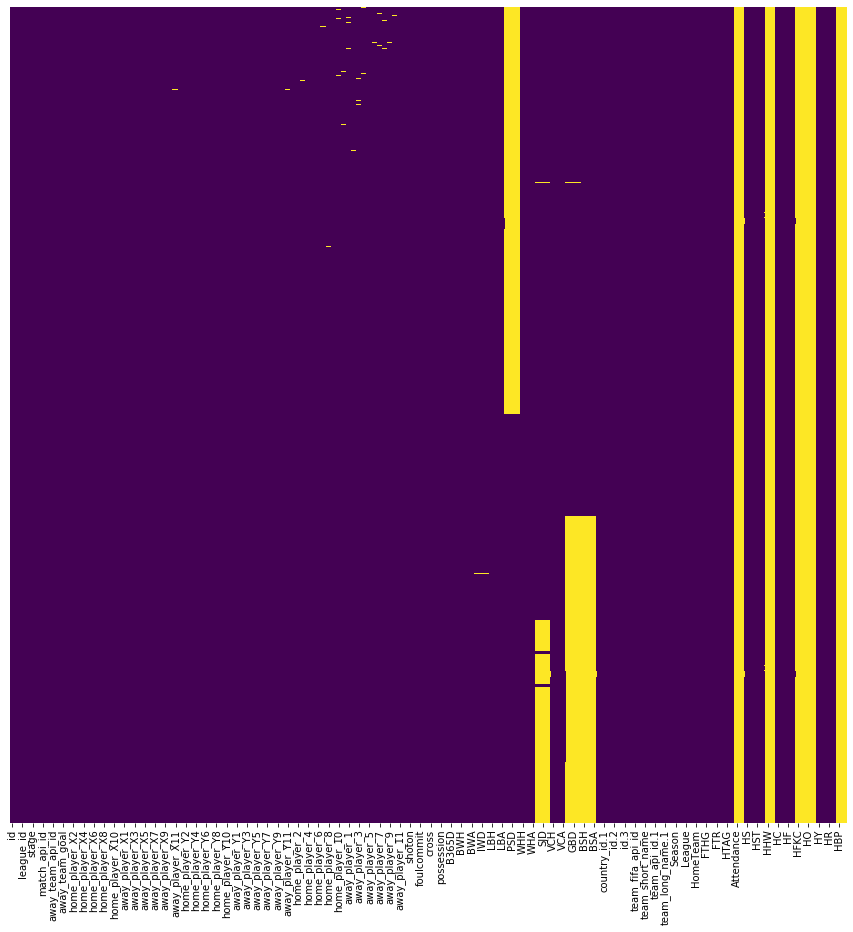

In [96]:
plt.figure(figsize=(15,15))
sns.heatmap(complete_bundesliga.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [97]:
complete_bundesliga.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2448 entries, 0 to 2447
Columns: 164 entries, id to ABP
dtypes: datetime64[ns](1), float64(119), int64(20), object(24)
memory usage: 3.1+ MB


## Testing hypothesis to see whether imputation of missing football player ratings

We will test to see whether it is reasonable to imputate the overall rating of a player based on the team's average (for the rating of the known players).

For this, we need a small mean of the standard deviation for the values contained in the home_team and away_team

Steps to take:

0. Only have clean matches
1. Perform a join with the most relevant rating based on the nearest date to the match date
2. Calculate the mean rating for both home_team and away_team.
3. Calculate the s.d. for both home_team and away_team.
4. Run the describe function.



### Step 0 : Only have clean matches


In [98]:
bundesliga_clean = complete_bundesliga.dropna(subset=players)

In [100]:
bundesliga_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2376 entries, 0 to 2447
Columns: 164 entries, id to ABP
dtypes: datetime64[ns](1), float64(119), int64(20), object(24)
memory usage: 3.0+ MB


### Step 1 : Perform a join with the most relevant rating based on the nearest date to the match date


In [101]:
players_ratings_clean.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183978 entries, 0 to 183977
Data columns (total 49 columns):
id                      183978 non-null int64
player_fifa_api_id      183978 non-null int64
player_api_id           183978 non-null int64
date                    183978 non-null object
overall_rating          183142 non-null float64
potential               183142 non-null float64
preferred_foot          183142 non-null object
attacking_work_rate     180748 non-null object
defensive_work_rate     183142 non-null object
crossing                183142 non-null float64
finishing               183142 non-null float64
heading_accuracy        183142 non-null float64
short_passing           183142 non-null float64
volleys                 181265 non-null float64
dribbling               183142 non-null float64
curve                   181265 non-null float64
free_kick_accuracy      183142 non-null float64
long_passing            183142 non-null float64
ball_control            183142 non-

In [102]:
#Column 'date' is currently a string, convert to datetime format
players_ratings_clean['date'] = pd.to_datetime(players_ratings_clean['date'])

In [103]:
players_ratings_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183978 entries, 0 to 183977
Data columns (total 49 columns):
id                      183978 non-null int64
player_fifa_api_id      183978 non-null int64
player_api_id           183978 non-null int64
date                    183978 non-null datetime64[ns]
overall_rating          183142 non-null float64
potential               183142 non-null float64
preferred_foot          183142 non-null object
attacking_work_rate     180748 non-null object
defensive_work_rate     183142 non-null object
crossing                183142 non-null float64
finishing               183142 non-null float64
heading_accuracy        183142 non-null float64
short_passing           183142 non-null float64
volleys                 181265 non-null float64
dribbling               183142 non-null float64
curve                   181265 non-null float64
free_kick_accuracy      183142 non-null float64
long_passing            183142 non-null float64
ball_control            183

In [104]:
bundesliga_clean.sort_values(by=['date'], inplace=True)
bundesliga_clean.head()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,goal,shoton,shotoff,foulcommit,card,cross,corner,possession,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,name,id.2,name.1,id.3,team_api_id,team_fifa_api_id,team_long_name,team_short_name,id.4,team_api_id.1,team_fifa_api_id.1,team_long_name.1,team_short_name.1,Season,Country,League,Div,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Attendance,Referee,HS,AS,HST,AST,HHW,AHW,HC,AC,HF,AF,HFKC,AFKC,HO,AO,HY,AY,HR,AR,HBP,ABP
0,7809,7809,7809,2008/2009,1,2008-08-15,499317,9823,9790,2,2,1.0,2.0,4.0,6.0,8.0,5.0,4.0,6.0,5.0,4.0,6.0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,3.0,5.0,7.0,1.0,3.0,3.0,3.0,3.0,5.0,7.0,7.0,9.0,11.0,11.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,10.0,10.0,10.0,27284.0,35988.0,39774.0,33085.0,30894.0,38244.0,30872.0,38843.0,95078.0,30638.0,32118.0,25524.0,36183.0,27293.0,37787.0,37156.0,30749.0,30598.0,39106.0,38216.0,33101.0,30764.0,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,1.57,3.8,6.0,1.55,3.70,5.45,1.6,3.6,4.8,1.53,3.50,5.50,NaN,NaN,NaN,1.53,3.50,5.50,1.62,3.40,5.50,1.55,3.50,5.50,1.60,3.60,5.75,1.53,3.75,5.50,7809,7809,Germany 1. Bundesliga,7809,Germany,15617,9823,21.0,FC Bayern Munich,BMU,15618,9790,28.0,Hamburger SV,HAM,2008/2009,Germany,Bundesliga 1,D1,Bayern Munich,Hamburg,2,2,D,2,1,H,NaN,NaN,16.0,13.0,3.0,3.0,NaN,NaN,2.0,2.0,16.0,26.0,NaN,NaN,NaN,NaN,1.0,4.0,0.0,0.0,NaN,NaN
1,7810,7809,7809,2008/2009,1,2008-08-16,499318,8178,9789,2,3,1.0,2.0,4.0,6.0,8.0,5.0,3.0,5.0,7.0,4.0,6.0,1.0,2.0,4.0,6.0,8.0,2.0,4.0,6.0,8.0,4.0,6.0,1.0,3.0,3.0,3.0,3.0,5.0,7.0,7.0,7.0,10.0,10.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,7.0,10.0,10.0,36147.0,27427.0,27492.0,128037.0,28081.0,27429.0,34681.0,49939.0,30937.0,27556.0,31199.0,27358.0,79737.0,71399.0,36388.0,27360.0,43319.0,36132.0,30707.0,27363.0,31718.0,27514.0,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,2.05,3.3,3.6,2.05,3.25,3.30,2.0,3.3,3.2,1.91,3.25,3.40,NaN,NaN,NaN,1.95,3.10,3.50,1.91,3.25,3.75,2.00,3.25,3.25,2.05,3.30,3.50,2.00,3.25,3.40,7809,7809,Germany 1. Bundesliga,7809,Germany,15619,8178,32.0,Bayer 04 Leverkusen,LEV,15620,9789,22.0,Borussia Dortmund,DOR,2008/2009,Germany,Bundesliga 1,D1,Leverkusen,Dortmund,2,3,A,1,2,A,NaN,NaN,19.0,11.0,9.0,4.0,NaN,NaN,7.0,3.0,13.0,20.0,NaN,NaN,NaN,NaN,3.0,2.0,0.0,0.0,NaN,NaN
3,7812,7809,7809,2008/2009,1,2008-08-16,499320,8721,8722,2,1,1.0,2.0,4.0,6.0,8.0,5.0,3.0,5.0,7.0,4.0,6.0,1.0,2.0,4.0,6.0,8.0,5.0,4.0,6.0,5.0,4.0,6.0,1.0,3.0,3.0,3.0,3.0,5.0,7.0,7.0,7.0,10.0,10.0,1.0,3.0,3.0,3.0,3.0,5.0,7.0,7.0,9.0,11.0,11.0,30820.0,30906.0,30914.0,30902.0,37317.0,19511.0,30530.0,27324.0,38606.0,39902.0,27339.0,26173.0,42184.0,97491.0,382

In [105]:
players_ratings_clean.sort_values(by='date', inplace=True)

In [106]:
players_ratings_clean.head()

,id,player_fifa_api_id,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,free_kick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,id.1,player_api_id.1,player_name,player_fifa_api_id.1,birthday,height,weight
183977,183978,102359,39902,2007-02-22,80.0,81.0,right,medium,low,74.0,68.0,57.0,88.0,77.0,87.0,86.0,53.0,78.0,91.0,58.0,64.0,77.0,66.0,73.0,72.0,58.0,67.0,59.0,78.0,63.0,63.0,68.0,88.0,53.0,38.0,32.0,30.0,9.0,9.0,78.0,7.0,15.0,11075,39902,Zvjezdan Misimovic,102359,1982-06-05 00:00:00,180.34,176
79627,79628,45453,38343,2007-02-22,67.0,69.0,left,medium,medium,63.0,62.0,59.0,63.0,38.0,68.0,53.0,65.0,51.0,62.0,61.0,68.0,65.0,64.0,61.0,66.0,69.0,83.0,54.0,61.0,58.0,62.0,60.0,63.0,65.0,44.0,64.0,64.0,7.0,15.0,51.0,8.0,6.0,4797,38343,Jef Delen,45453,1976-06-29 00:00:00,175.26,139
79620,79621,149086,42091,2007-02-22,67.0,72.0,right,medium,medium,66.0,71.0,49.0,38.0,70.0,78.0,70.0,58.0,76.0,71.0,71.0,76.0,70.0,49.0,66.0,69.0,76.0,73.0,68.0,56.0,58.0,49.0,73.0,70.0,58.0,64.0,21.0,33.0,9.0,10.0,76.0,6.0,15.0,4796,42091,Jedaias Capucho Neves,149086,1979-04-15 00:00:00,175.26,163
79610,79611,192317,190142,2007-02-22,52.0,75.0,left,medium,medium,4.0,4.0,11.0,18.0,6.0,6.0,8.0,5.0,21.0,18.0,47.0,43.0,33.0,40.0,41.0,21.0,40.0,52.0,50.0,3.0,21.0,21.0,17.0,14.0,3.0,23.0,11.0,10.0,60.0,47.0,48.0,53.0,51.0,4795,190142,Jed Steer,192317,1992-09-23 00:00:00,182.88,176
79579,79580,169171,37978,2007-02-22,69.0,78.0,right,medium,low,59.0,63.0,53.0,59.0,61.0,72.0,43.0,53.0,55.0,62.0,82.0,84.0,74.0,67.0,76.0,69.0,70.0,78.0,68.0,61.0,59.0,43.0,48.0,46.0,53.0,27.0,43.0,34.0,1.0,3.0,55.0,9.0,5.0,4794,37978,Jeanvion Yulu-Matondo,169171,1986-01-05 00:00:00,177.80,163


In [107]:
players_ratings_clean.tail()

,id,player_fifa_api_id,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,free_kick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,id.1,player_api_id.1,player_name,player_fifa_api_id.1,birthday,height,weight
57229,57230,197948,184521,2016-07-07,73.0,77.0,right,medium,high,51.0,42.0,75.0,68.0,42.0,47.0,47.0,41.0,67.0,62.0,49.0,55.0,52.0,67.0,47.0,77.0,55.0,74.0,92.0,66.0,77.0,72.0,46.0,32.0,43.0,74.0,75.0,69.0,11.0,15.0,15.0,12.0,7.0,3427,184521,Florian Lejeune,197948,1991-05-20 00:00:00,187.96,179
1329,1330,231638,495841,2016-07-07,72.0,84.0,right,medium,medium,49.0,78.0,71.0,63.0,56.0,74.0,45.0,43.0,49.0,73.0,82.0,81.0,60.0,71.0,60.0,73.0,61.0,64.0,63.0,70.0,35.0,20.0,69.0,59.0,77.0,20.0,20.0,21.0,6.0,14.0,13.0,8.0,6.0,87,495841,Adalberto Penaranda,231638,1997-05-31 00:00:00,182.88,172
153508,153509,172555,45400,2016-07-07,68.0,70.0,right,medium,low,33.0,70.0,56.0,63.0,60.0,63.0,55.0,27.0,56.0,66.0,90.0,84.0,73.0,60.0,64.0,75.0,67.0,63.0,59.0,69.0,83.0,37.0,75.0,45.0,66.0,23.0,17.0,23.0,13.0,11.0,6.0,9.0,14.0,9222,45400,Ronnie Schwartz,172555,1989-08-29 00:00:00,182.88,176
19675,19676,166074,210065,2016-07-07,72.0,75.0,right,medium,low,67.0,67.0,57.0,66.0,69.0,80.0,67.0,73.0,58.0,77.0,78.0,90.0,68.0,73.0,55.0,85.0,65.0,78.0,83.0,70.0,56.0,24.0,67.0,61.0,66.0,19.0,24.0,21.0,15.0,7.0,8.0,7.0,11.0,1157,210065,Bebe,166074,1990-07-12 00:00:00,190.50,183
95620,95621,208127,307224,2016-07-07,64.0,68.0,right,medium,low,44.0,63.0,73.0,49.0,52.0,52.0,42.0,31.0,45.0,63.0,71.0,70.0,59.0,57.0,48.0,69.0,48.0,73.0,86.0,53.0,55.0,22.0,66.0,55.0,65.0,22.0,22.0,25.0,12.0,12.0,7.0,11.0,12.0,5759,307224,Kevin Koubemba,208127,1993-03-23 00:00:00,193.04,198


We are now ready to perform the merge_asof which required the data to be ordered on the field name to join. :)

That is for us the two dataframes need to be ordered on the 'date' column. 

Let us further prepare the join:


In [108]:
players_overall_ratings = players_ratings_clean[['player_api_id','overall_rating', 'date']]

In [109]:
players_overall_ratings = players_overall_ratings.reset_index(drop=True)

In [110]:
players_overall_ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183978 entries, 0 to 183977
Data columns (total 3 columns):
player_api_id     183978 non-null int64
overall_rating    183142 non-null float64
date              183978 non-null datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 4.2 MB


In [111]:
players_overall_ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183978 entries, 0 to 183977
Data columns (total 3 columns):
player_api_id     183978 non-null int64
overall_rating    183142 non-null float64
date              183978 non-null datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 4.2 MB


In [112]:
players_overall_ratings.head()

,player_api_id,overall_rating,date
0,39902,80.0,2007-02-22
1,38343,67.0,2007-02-22
2,42091,67.0,2007-02-22
3,190142,52.0,2007-02-22
4,37978,69.0,2007-02-22


In [113]:
bundesliga_clean = bundesliga_clean.reset_index(drop=True)

In [114]:
bundesliga_clean.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2376 entries, 0 to 2375
Data columns (total 164 columns):
id                    int64
country_id            int64
league_id             int64
season                object
stage                 int64
date                  datetime64[ns]
match_api_id          int64
home_team_api_id      int64
away_team_api_id      int64
home_team_goal        int64
away_team_goal        int64
home_player_X1        float64
home_player_X2        float64
home_player_X3        float64
home_player_X4        float64
home_player_X5        float64
home_player_X6        float64
home_player_X7        float64
home_player_X8        float64
home_player_X9        float64
home_player_X10       float64
home_player_X11       float64
away_player_X1        float64
away_player_X2        float64
away_player_X3        float64
away_player_X4        float64
away_player_X5        float64
away_player_X6        float64
away_player_X7        float64
away_player_X8        float64
away

In [115]:
bundesliga_clean.tail()

,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,goal,shoton,shotoff,foulcommit,card,cross,corner,possession,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,name,id.2,name.1,id.3,team_api_id,team_fifa_api_id,team_long_name,team_short_name,id.4,team_api_id.1,team_fifa_api_id.1,team_long_name.1,team_short_name.1,Season,Country,League,Div,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Attendance,Referee,HS,AS,HST,AST,HHW,AHW,HC,AC,HF,AF,HFKC,AFKC,HO,AO,HY,AY,HR,AR,HBP,ABP
2371,10197,7809,7809,2015/2016,34,2016-05-14,2002490,8721,10269,3,1,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,170322.0,40193.0,28480.0,38432.0,37317.0,520342.0,161421.0,188498.0,298915.0,58346.0,178812.0,69149.0,182893.0,97734.0,514301.0,47547.0,182892.0,27324.0,450980.0,141145.0,281012.0,107717.0,<goal><value><comment>n</comment><stats><goals...,<shoton><value><stats><blocked>1</blocked></st...,<shotoff><value><stats><shotoff>1</shotoff></s...,<foulcommit><value><stats><foulscommitted>1</f...,<card><value><comment>y</comment><stats><ycard...,<cross><value><stats><crosses>1</crosses></sta...,<corner><value><stats><corners>1</corners></st...,<possession><value><comment>58</comment><stats...,2.30,4.00,2.75,2.35,3.8,2.60,2.50,3.5,2.5,2.25,3.8,2.75,2.34,4.10,2.86,2.45,3.60,2.6,NaN,NaN,NaN,2.38,4.1,2.7,NaN,NaN,NaN,NaN,NaN,NaN,7809,7809,Germany 1. Bundesliga,7809,Germany,15623,8721,175.0,VfL Wolfsburg,WOL,15632,10269,36.0,VfB Stuttgart,STU,2015/2016,Germany,Bundesliga 1,D1,Wolfsburg,Stuttgart,3,1,H,2,0,H,NaN,NaN,17.0,13.0,7.0,6.0,NaN,NaN,7.0,9.0,8.0,12.0,NaN,NaN,NaN,NaN,2.0,2.0,0.0,0.0,NaN,NaN
2372,10198,7809,7809,2015/2016,34,2016-05-14,2002491,8406,9790,1,3,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,114737.0,111858.0,245526.0,29543.0,488298.0,303905.0,37319.0,114650.0,35997.0,150922.0,129918.0,94658.0,157252.0,30986.0,307069.0,240348.0,16300.0,128827.0,97747.0,198316.0,120845.0,193530.0,<goal><value><comment>n</comment><stats><goals...,<shoton><value><stats><blocked>1</blocked></st...,<shotoff><value><stats><shotoff>1</shotoff></s...,<foulcommit><value><stats><foulscommitted>1</f...,<card><value><comment>y</comment><stats><ycard...,<cross><value><stats><crosses>1</crosses></sta...,<corner><value><stats><corners>1</corners></st...,<possession><value><comment>44</comment><stats...,2.00,3.50,3.80,2.00,3.5,3.50,2.00,3.3,3.6,2.00,3.5,3.60,2.02,3.70,3.94,2.00,3.60,3.2,NaN,NaN,NaN,2.00,3.7,3.7,NaN,NaN,NaN,NaN,NaN,NaN,7809,7809,Germany 1. Bundesliga,7809,Germany,17465,8406,100409.0,FC Augsburg,AUG,15618,9790,28.0,Hamburger SV,HAM,2015/2016,Germany,Bundesliga 1,D1,Augsburg,Hamburg,1,3,

In [116]:
bundesliga_clean.columns

Index(['id', 'country_id', 'league_id', 'season', 'stage', 'date', 'match_api_id', 'home_team_api_id', 'away_team_api_id', 'home_team_goal',
       ...
       'HFKC', 'AFKC', 'HO', 'AO', 'HY', 'AY', 'HR', 'AR', 'HBP', 'ABP'], dtype='object', length=164)

In [117]:
#Column 'home_player_1' is currently a float64, convert to int64
bundesliga_clean['home_player_1'] = bundesliga_clean.home_player_1.astype(dtype=int)

In [118]:
bundesliga_clean.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2376 entries, 0 to 2375
Data columns (total 164 columns):
id                    int64
country_id            int64
league_id             int64
season                object
stage                 int64
date                  datetime64[ns]
match_api_id          int64
home_team_api_id      int64
away_team_api_id      int64
home_team_goal        int64
away_team_goal        int64
home_player_X1        float64
home_player_X2        float64
home_player_X3        float64
home_player_X4        float64
home_player_X5        float64
home_player_X6        float64
home_player_X7        float64
home_player_X8        float64
home_player_X9        float64
home_player_X10       float64
home_player_X11       float64
away_player_X1        float64
away_player_X2        float64
away_player_X3        float64
away_player_X4        float64
away_player_X5        float64
away_player_X6        float64
away_player_X7        float64
away_player_X8        float64
away

In [119]:
test_10 = pd.merge_asof(left=bundesliga_clean,
                        right=players_overall_ratings,
                        on=["date"],
                        left_by=["home_player_1"],
                        right_by=["player_api_id"],
                        direction= 'nearest')

In [120]:

test_10.info(verbose= True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2376 entries, 0 to 2375
Data columns (total 166 columns):
id                    2376 non-null int64
country_id            2376 non-null int64
league_id             2376 non-null int64
season                2376 non-null object
stage                 2376 non-null int64
date                  2376 non-null datetime64[ns]
match_api_id          2376 non-null int64
home_team_api_id      2376 non-null int64
away_team_api_id      2376 non-null int64
home_team_goal        2376 non-null int64
away_team_goal        2376 non-null int64
home_player_X1        2376 non-null float64
home_player_X2        2376 non-null float64
home_player_X3        2376 non-null float64
home_player_X4        2376 non-null float64
home_player_X5        2376 non-null float64
home_player_X6        2376 non-null float64
home_player_X7        2376 non-null float64
home_player_X8        2376 non-null float64
home_player_X9        2376 non-null float64
home_player_X10       23

In [121]:
#Column of the players are currently a float64, convert to int64

for player in players:
    
    bundesliga_clean[player] = bundesliga_clean[player].astype(dtype=int)

In [122]:
all_columns = pd.Series(list(bundesliga_clean) + list(players_overall_ratings))
all_columns[all_columns.duplicated()]

166    date
dtype: object

In [123]:

for player in players:
    
    bundesliga_clean = pd.merge_asof(left=bundesliga_clean,
                        right=players_overall_ratings,
                        on=["date"],
                        left_by=[player],
                        right_by=["player_api_id"],
                        suffixes = ["", "_" + player],
                        direction= 'backward')

In [124]:
bundesliga_clean.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2376 entries, 0 to 2375
Data columns (total 208 columns):
id                               2376 non-null int64
country_id                       2376 non-null int64
league_id                        2376 non-null int64
season                           2376 non-null object
stage                            2376 non-null int64
date                             2376 non-null datetime64[ns]
match_api_id                     2376 non-null int64
home_team_api_id                 2376 non-null int64
away_team_api_id                 2376 non-null int64
home_team_goal                   2376 non-null int64
away_team_goal                   2376 non-null int64
home_player_X1                   2376 non-null float64
home_player_X2                   2376 non-null float64
home_player_X3                   2376 non-null float64
home_player_X4                   2376 non-null float64
home_player_X5                   2376 non-null float64
home_player_X6          

In [125]:
bundesliga_clean.rename(columns={'overall_rating': 'overall_rating_home_player_1'}, inplace=True)

In [126]:

home_players_ratings= ["overall_rating_home_player_" + str(x) for x in range(1, 12)]
away_players_ratings = ["overall_rating_away_player_" + str(x) for x in range(1, 12)]

In [127]:
home_players_ratings

['overall_rating_home_player_1',
 'overall_rating_home_player_2',
 'overall_rating_home_player_3',
 'overall_rating_home_player_4',
 'overall_rating_home_player_5',
 'overall_rating_home_player_6',
 'overall_rating_home_player_7',
 'overall_rating_home_player_8',
 'overall_rating_home_player_9',
 'overall_rating_home_player_10',
 'overall_rating_home_player_11']

### Step 2 and 3: Calculate the mean  rating and standard deviation for both home_team and away_team


In [128]:
bundesliga_clean['home_team_rating_avg'] = bundesliga_clean[home_players_ratings].mean(axis=1)

bundesliga_clean['away_team_rating_avg'] = bundesliga_clean[away_players_ratings].mean(axis=1)

bundesliga_clean['home_team_rating_std'] = bundesliga_clean[home_players_ratings].std(axis=1)

bundesliga_clean['away_team_rating_std'] = bundesliga_clean[away_players_ratings].std(axis=1)

### Step 4: Run the describe function

In [129]:
bundesliga_clean.tail()

,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,goal,shoton,shotoff,foulcommit,card,cross,corner,possession,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,name,id.2,name.1,id.3,team_api_id,team_fifa_api_id,team_long_name,team_short_name,id.4,team_api_id.1,team_fifa_api_id.1,team_long_name.1,team_short_name.1,Season,Country,League,Div,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Attendance,Referee,HS,AS,HST,AST,HHW,AHW,HC,AC,HF,AF,HFKC,AFKC,HO,AO,HY,AY,HR,AR,HBP,ABP,player_api_id,overall_rating_home_player_1,player_api_id_home_player_2,overall_rating_home_player_2,player_api_id_home_player_3,overall_rating_home_player_3,player_api_id_home_player_4,overall_rating_home_player_4,player_api_id_home_player_5,overall_rating_home_player_5,player_api_id_home_player_6,overall_rating_home_player_6,player_api_id_home_player_7,overall_rating_home_player_7,player_api_id_home_player_8,overall_rating_home_player_8,player_api_id_home_player_9,overall_rating_home_player_9,player_api_id_home_player_10,overall_rating_home_player_10,player_api_id_home_player_11,overall_rating_home_player_11,player_api_id_away_player_1,overall_rating_away_player_1,player_api_id_away_player_2,overall_rating_away_player_2,player_api_id_away_player_3,overall_rating_away_player_3,player_api_id_away_player_4,overall_rating_away_player_4,player_api_id_away_player_5,overall_rating_away_player_5,player_api_id_away_player_6,overall_rating_away_player_6,player_api_id_away_player_7,overall_rating_away_player_7,player_api_id_away_player_8,overall_rating_away_player_8,player_api_id_away_player_9,overall_rating_away_player_9,player_api_id_away_player_10,overall_rating_away_player_10,player_api_id_away_player_11,overall_rating_away_player_11,home_team_rating_avg,away_team_rating_avg,home_team_rating_std,away_team_rating_std
2371,10197,7809,7809,2015/2016,34,2016-05-14,2002490,8721,10269,3,1,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,2.0,4.0,6.0,8.0,4.0,6.0,3.0,5.0,7.0,5.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,1.0,3.0,3.0,3.0,3.0,6.0,6.0,8.0,8.0,8.0,11.0,170322,40193,28480,38432,37317,520342,161421,188498,298915,58346,178812,69149,182893,97734,514301,47547,182892,27324,450980,141145,281012,107717,<goal><value><comment>n</comment><stats><goals...,<shoton><value><stats><blocked>1</blocked></st...,<shotoff><value><stats><shotoff>1</shotoff></s...,<foulcommit><value><stats><foulscommitted>1</f...,<card><value><comment>y</comment><stats><ycard...,<cross><value><stats><crosses>1</crosses></sta...,<corner><value><stats><corners>1</corners></st...,<possession><value><comment>58</comment><stats...,2.30,4.00,2.75,2.35,3.8,2.60,2.50,3.5,2.5,2.25,3.8,2.75,2.34,4.10,2.86,2.45,3.60,2.6,NaN,NaN,NaN,2.38,4.1,2.7,NaN,NaN,NaN,NaN,NaN,NaN,7809,7809,Germany 1. Bundesliga,7809,Germany,15623,8721,175.0,VfL Wolfsburg,WOL,15632,10269,36.0,VfB Stuttgart,STU,2015/201

In [130]:
bundesliga_clean.head()

,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,goal,shoton,shotoff,foulcommit,card,cross,corner,possession,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,name,id.2,name.1,id.3,team_api_id,team_fifa_api_id,team_long_name,team_short_name,id.4,team_api_id.1,team_fifa_api_id.1,team_long_name.1,team_short_name.1,Season,Country,League,Div,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Attendance,Referee,HS,AS,HST,AST,HHW,AHW,HC,AC,HF,AF,HFKC,AFKC,HO,AO,HY,AY,HR,AR,HBP,ABP,player_api_id,overall_rating_home_player_1,player_api_id_home_player_2,overall_rating_home_player_2,player_api_id_home_player_3,overall_rating_home_player_3,player_api_id_home_player_4,overall_rating_home_player_4,player_api_id_home_player_5,overall_rating_home_player_5,player_api_id_home_player_6,overall_rating_home_player_6,player_api_id_home_player_7,overall_rating_home_player_7,player_api_id_home_player_8,overall_rating_home_player_8,player_api_id_home_player_9,overall_rating_home_player_9,player_api_id_home_player_10,overall_rating_home_player_10,player_api_id_home_player_11,overall_rating_home_player_11,player_api_id_away_player_1,overall_rating_away_player_1,player_api_id_away_player_2,overall_rating_away_player_2,player_api_id_away_player_3,overall_rating_away_player_3,player_api_id_away_player_4,overall_rating_away_player_4,player_api_id_away_player_5,overall_rating_away_player_5,player_api_id_away_player_6,overall_rating_away_player_6,player_api_id_away_player_7,overall_rating_away_player_7,player_api_id_away_player_8,overall_rating_away_player_8,player_api_id_away_player_9,overall_rating_away_player_9,player_api_id_away_player_10,overall_rating_away_player_10,player_api_id_away_player_11,overall_rating_away_player_11,home_team_rating_avg,away_team_rating_avg,home_team_rating_std,away_team_rating_std
0,7809,7809,7809,2008/2009,1,2008-08-15,499317,9823,9790,2,2,1.0,2.0,4.0,6.0,8.0,5.0,4.0,6.0,5.0,4.0,6.0,1.0,2.0,4.0,6.0,8.0,3.0,5.0,7.0,3.0,5.0,7.0,1.0,3.0,3.0,3.0,3.0,5.0,7.0,7.0,9.0,11.0,11.0,1.0,3.0,3.0,3.0,3.0,7.0,7.0,7.0,10.0,10.0,10.0,27284,35988,39774,33085,30894,38244,30872,38843,95078,30638,32118,25524,36183,27293,37787,37156,30749,30598,39106,38216,33101,30764,<goal><value><comment>n</comment><stats><goals...,<shoton />,<shotoff />,<foulcommit />,<card><value><comment>y</comment><stats><ycard...,<cross />,<corner />,<possession />,1.57,3.8,6.0,1.55,3.70,5.45,1.6,3.6,4.8,1.53,3.50,5.50,NaN,NaN,NaN,1.53,3.50,5.50,1.62,3.40,5.50,1.55,3.50,5.50,1.60,3.60,5.75,1.53,3.75,5.50,7809,7809,Germany 1. Bundesliga,7809,Germany,15617,9823,21.0,FC Bayern Munich,BMU,15618,9790,28.0,Hamburger SV,HAM,2008/2009,Germany,Bundesliga 1,D1,Bayern Munich,Hamburg,2,2,D,2,1,H,NaN,NaN,16.0,13.0,3.0,3.0,NaN,NaN,2.0,2.0,16.0,26.0,NaN,NaN,NaN,NaN,1.0,4.0,0.0,0.0,NaN,NaN,27284,76.0,35988,67.0,39774,88.0,33085,83.0,30894,85.0,38244,84.0,30872,81.0,38843,

In [131]:
bundesliga_clean.describe()

,id,country_id,league_id,stage,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,away_team_goal,home_player_X1,home_player_X2,home_player_X3,home_player_X4,home_player_X5,home_player_X6,home_player_X7,home_player_X8,home_player_X9,home_player_X10,home_player_X11,away_player_X1,away_player_X2,away_player_X3,away_player_X4,away_player_X5,away_player_X6,away_player_X7,away_player_X8,away_player_X9,away_player_X10,away_player_X11,home_player_Y1,home_player_Y2,home_player_Y3,home_player_Y4,home_player_Y5,home_player_Y6,home_player_Y7,home_player_Y8,home_player_Y9,home_player_Y10,home_player_Y11,away_player_Y1,away_player_Y2,away_player_Y3,away_player_Y4,away_player_Y5,away_player_Y6,away_player_Y7,away_player_Y8,away_player_Y9,away_player_Y10,away_player_Y11,home_player_1,home_player_2,home_player_3,home_player_4,home_player_5,home_player_6,home_player_7,home_player_8,home_player_9,home_player_10,home_player_11,away_player_1,away_player_2,away_player_3,away_player_4,away_player_5,away_player_6,away_player_7,away_player_8,away_player_9,away_player_10,away_player_11,B365H,B365D,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,LBA,PSH,PSD,PSA,WHH,WHD,WHA,SJH,SJD,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA,id.1,country_id.1,id.2,id.3,team_api_id,team_fifa_api_id,id.4,team_api_id.1,team_fifa_api_id.1,FTHG,FTAG,HTHG,HTAG,Attendance,HS,AS,HST,AST,HHW,AHW,HC,AC,HF,AF,HFKC,AFKC,HO,AO,HY,AY,HR,AR,HBP,ABP,player_api_id,overall_rating_home_player_1,player_api_id_home_player_2,overall_rating_home_player_2,player_api_id_home_player_3,overall_rating_home_player_3,player_api_id_home_player_4,overall_rating_home_player_4,player_api_id_home_player_5,overall_rating_home_player_5,player_api_id_home_player_6,overall_rating_home_player_6,player_api_id_home_player_7,overall_rating_home_player_7,player_api_id_home_player_8,overall_rating_home_player_8,player_api_id_home_player_9,overall_rating_home_player_9,player_api_id_home_player_10,overall_rating_home_player_10,player_api_id_home_player_11,overall_rating_home_player_11,player_api_id_away_player_1,overall_rating_away_player_1,player_api_id_away_player_2,overall_rating_away_player_2,player_api_id_away_player_3,overall_rating_away_player_3,player_api_id_away_player_4,overall_rating_away_player_4,player_api_id_away_player_5,overall_rating_away_player_5,player_api_id_away_player_6,overall_rating_away_player_6,player_api_id_away_player_7,overall_rating_away_player_7,player_api_id_away_player_8,overall_rating_away_player_8,player_api_id_away_player_9,overall_rating_away_player_9,player_api_id_away_player_10,overall_rating_away_player_10,player_api_id_away_player_11,overall_rating_away_player_11,home_team_rating_avg,away_team_rating_avg,home_team_rating_std,away_team_rating_std
count,2376.000000,2376.0,2376.0,2376.000000,2.376000e+03,2376.000000,2376.000000,2376.000000,2376.000000,2376.0,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.0,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2374.000000,2376.0,2376.0,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.0,2376.0,2376.0,2376.0,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2374.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2376.000000,2375.000000,2375.000000,2375.000000,2375.000000,2375.000000,2375.000000,2370.000000,2370.000000,2370.000000,2375.000000,2375.000000,2375.000000,1223.000000,1223.000000,1223.000000,2375.000000,2375.000000,2375.000000,1788.000000,1788.000000,1788.000000,2375.000000,2375.000000,2375.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,2376.0,2376.0,2376.0,2376.000000,2376.000

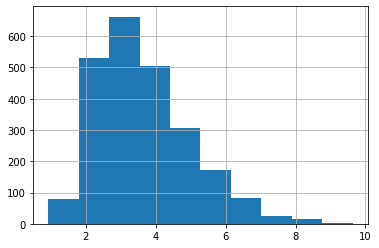

In [132]:
bundesliga_clean.home_team_rating_std.hist();

Text(0, 0.5, 'Gaussian Kernel Density Estimate')

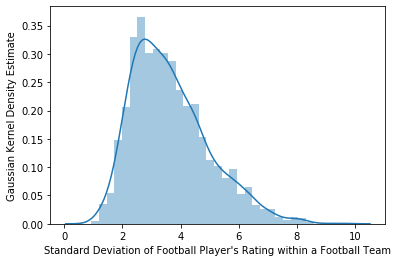

In [186]:


#x = bundesliga_clean.home_team_rating_std(x, name="Football Player's Rating Standard Deviation within a Football Team")

ax = sns.distplot(bundesliga_clean.home_team_rating_std, axlabel= "Standard Deviation of Football Player's Rating within a Football Team")
ax.set_ylabel('Gaussian Kernel Density Estimate')

In [138]:
import statsmodels.api as sm

In [160]:
results = []

for i in range(2376):
    
    row_to_analyse = bundesliga_clean[home_players_ratings].iloc[i]    

    results.append(sm.stats.diagnostic.normal_ad(row_to_analyse)[1])
    


/anaconda3/lib/python3.6/site-packages/statsmodels/stats/_adnorm.py:66: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)
/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1748: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


In [161]:
len(results)

2376

In [162]:
p_value_series = pd.Series(results)

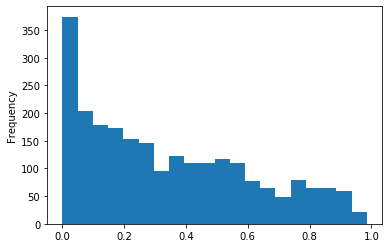

In [163]:
p_value_series.plot.hist(bins= 20);

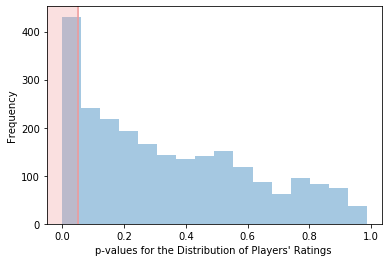

In [183]:
ax = sns.distplot(p_value_series, axlabel= "p-values for the Distribution of Players' Ratings ", hist= True, kde= False )


#plt.plot([0.05, 0.05], [0, 440])

x0 = 0.05


#plotting the two lines
p1 = plt.axvline(x=x0,color='#EF9A9A')

xlim = ax.get_xlim()
ax.axvspan(x0, xlim[0], color='#EF9A9A', alpha=0.3)

#reset xlim
ax.set_xlim(xlim)
ax.set_ylabel('Frequency')
plt.show()

In [143]:
p_value_series.describe()

count    2376.000000
mean        0.342117
std         0.271056
min         0.000000
25%         0.105379
50%         0.281686
75%         0.541173
max         0.985328
dtype: float64

In [144]:
result = bundesliga_clean[home_players_ratings].iloc[0:2376]

In [ ]:
result

In [189]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets
from sklearn.datasets import make_blobs


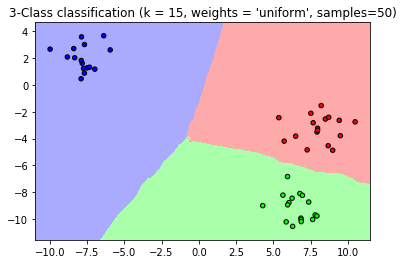

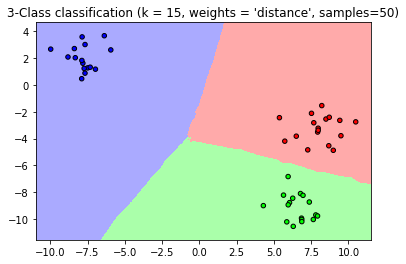

In [202]:

n_neighbors = 15


# we create 40 separable points
X, y = make_blobs(n_samples=50, centers=3, random_state=6)


h = .02  # step size in the mesh

# Create color maps
cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF'])
cmap_bold = ListedColormap(['#FF0000', '#00FF00', '#0000FF'])

for weights in ['uniform', 'distance']:
    # we create an instance of Neighbours Classifier and fit the data.
    clf = neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
    clf.fit(X, y)

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot also the training points
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold,
                edgecolor='k', s=20)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title("3-Class classification (k = %i, weights = '%s', samples=50)"
              % (n_neighbors, weights))

plt.show()

## Imputation of Bundesliga missing player ratings

In [ ]:
complete_bundesliga.info(verbose=True, null_counts=True)

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(complete_bundesliga.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [ ]:
complete_bundesliga.sort_values(by=['date'], inplace=True)

In [ ]:
#Column of the players are currently a float64, convert to int64

for player in players:
    
    complete_bundesliga[player] = complete_bundesliga[player].fillna(-1)
    
    complete_bundesliga[player] = complete_bundesliga[player].astype(dtype=int)
    
    #df[col] = df[col].astype(str)
    #complete_bundesliga[player] = complete_bundesliga[player].replace(-1, np.nan)
    
   

ATTENTION: NULL VALUES have been converted to the value of *** -1 ***.

In [ ]:
complete_bundesliga.info(verbose = True, null_counts=True)

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(complete_bundesliga.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [ ]:
bundesliga_clean_with_ratings_test = complete_bundesliga.copy()

In [ ]:
for player in players:
    
    bundesliga_clean_with_ratings_test = pd.merge_asof(left=bundesliga_clean_with_ratings_test,
                                                  right=players_overall_ratings,
                                                  on=["date"],
                                                  left_by=[player],
                                                  right_by=["player_api_id"],
                                                  suffixes = ["", "_" + player],
                                                  direction= 'backward')

In [ ]:
bundesliga_clean_with_ratings_test.info(verbose=True, null_counts=True)

As can be seen above, some players did not have an overall rating before the match commenced, hence imputation for known players is also something to be deatlt with.

This is reflected in player_api_id_home_player_3: 2441 non-null values (non-null and that are also not '-1') and its associated value overall_rating_home_player_3: 2437 non-null values (maybe these players are not in the database, however, I strongly suspect that the reason of why 'column 2' is lower than 'column1' is due to match on the 'backward' direction of player ratings ***BEFORE*** the relevant match.

In [ ]:
bundesliga_clean_with_ratings_test.rename(columns={'overall_rating': 'overall_rating_home_player_1'}, inplace=True)

In [ ]:
bundesliga_clean_with_ratings_test['home_team_rating_avg'] = bundesliga_clean_with_ratings_test[home_players_ratings].mean(axis=1)

bundesliga_clean_with_ratings_test['away_team_rating_avg'] = bundesliga_clean_with_ratings_test[away_players_ratings].mean(axis=1)

bundesliga_clean_with_ratings_test['home_team_rating_std'] = bundesliga_clean_with_ratings_test[home_players_ratings].std(axis=1)

bundesliga_clean_with_ratings_test['away_team_rating_std'] = bundesliga_clean_with_ratings_test[away_players_ratings].std(axis=1)

In [ ]:
bundesliga_clean_with_ratings_test.head(20)

In [ ]:
bundesliga_clean_with_ratings_test.to_excel("bundesliga_clean_with_ratings_excel.xlsx")  # 

In [ ]:
bundesliga_clean_with_ratings_test2 = bundesliga_clean_with_ratings_test.copy()

In [ ]:
bundesliga_clean_with_ratings_test2[home_players_ratings] = bundesliga_clean_with_ratings_test2[home_players_ratings].T.fillna(bundesliga_clean_with_ratings_test2[home_players_ratings].mean(axis=1)).T

In [ ]:
bundesliga_clean_with_ratings_test2.head(20)

In [ ]:
bundesliga_clean_with_ratings_test2[away_players_ratings] = bundesliga_clean_with_ratings_test2[away_players_ratings].T.fillna(bundesliga_clean_with_ratings_test2[away_players_ratings].mean(axis=1)).T

In [ ]:
bundesliga_clean_with_ratings_test2.head(20)

In [ ]:
bundesliga_clean_with_ratings_test2.info(verbose=True, null_counts=True)

In [ ]:
bundesliga_clean_with_ratings_test2.to_csv("bundesliga_very_clean", index=False)

In [ ]:


for i, col in enumerate(bundesliga_clean_with_ratings_test1[home_players_ratings]):
    
    # using i allows for duplicate columns
    # inplace *may* not always work here, so IMO the next line is preferred
    # df.iloc[:, i].fillna(m, inplace=True)
    bundesliga_clean_with_ratings_test1[home_players_ratings].iloc[:, i] = bundesliga_clean_with_ratings_test1[home_players_ratings].iloc[:, i].fillna(bundesliga_clean_with_ratings_test1['home_team_rating_avg'])




In [ ]:
bundesliga_clean_with_ratings_test1.head(20)

In [ ]:
bundesliga_clean_with_ratings[home_players_ratings].apply(lambda row: row.fillna(bundesliga_clean_with_ratings['home_team_rating_avg']), axis=1)

In [ ]:
bundesliga_clean_with_ratings.head()

In [ ]:
results_1 = []

for i in range(73):
    
    row_to_analys = bundesliga_clean_with_ratings[home_players_ratings].iloc[i]    

    results_1.append(sm.stats.diagnostic.normal_ad(row_to_analys)[1])
    
p_value_series_1 = pd.Series(results_1)

In [ ]:
p_value_series_1.describe()

In [ ]:
p_value_series_1.plot.hist(bins= 20);

In [ ]:
#bundesliga_clean_with_ratings[home_players_ratings].fillna(bundesliga_clean_with_ratings[home_players_ratings].mean(axis=1), axis =1, inplace=True)

#df[home_players_ratings].apply(lambda row: row.fillna(row.mean()), axis=1)

bundesliga_clean_with_ratings[home_players_ratings].apply(lambda row: row.fillna(bundesliga_clean_with_ratings['home_team_rating_avg'], axis=1)

#bundesliga_clean_with_ratings[home_players_ratings] = bundesliga_clean_with_ratings[home_players_ratings].fillna(bundesliga_clean_with_ratings['home_team_rating_avg'], axis =1)


#for home_player_rating in home_players_ratings:
    

## Distinct Section: trying to rescue the Player IDs

In [ ]:
mask1 = complete_bundesliga['away_player_1'].isnull() | complete_bundesliga['away_player_2'].isnull() | complete_bundesliga['away_player_3'].isnull() | complete_bundesliga['away_player_4'].isnull() | complete_bundesliga['away_player_5'].isnull() | complete_bundesliga['away_player_6'].isnull() | complete_bundesliga['away_player_7'].isnull() | complete_bundesliga['away_player_8'].isnull() | complete_bundesliga['away_player_9'].isnull() | complete_bundesliga['away_player_10'].isnull()| complete_bundesliga['away_player_11'].isnull() | complete_bundesliga['home_player_1'].isnull()| complete_bundesliga['home_player_2'].isnull() | complete_bundesliga['home_player_3'].isnull()| complete_bundesliga['home_player_4'].isnull() | complete_bundesliga['home_player_5'].isnull()| complete_bundesliga['home_player_6'].isnull() | complete_bundesliga['home_player_7'].isnull()| complete_bundesliga['home_player_8'].isnull() | complete_bundesliga['home_player_9'].isnull()| complete_bundesliga['home_player_10'].isnull() | complete_bundesliga['home_player_11'].isnull()
        
matches_to_clean = complete_bundesliga[mask1]

In [ ]:
#for player in players:
    matches_to_clean = complete_bundesliga[(complete_bundesliga[player].isnull())]

In [ ]:
matches_to_clean.info(verbose=True, null_counts= True)

In [ ]:
test23 = matches_to_clean.copy()

In [ ]:
test23.sort_values(by=['date'], inplace=True)

In [ ]:
test23.info(verbose=True, null_counts=True)

In [ ]:
#Column of the players are currently a float64, convert to int64

for player in players:
    
    test23[player] = test23[player].fillna(-1)
    
    test23[player] = test23[player].astype(dtype=int)
    
    #df[col] = df[col].astype(str)
    #test23[player] = test23[player].replace(-1, np.nan)
    
   

In [ ]:
test23.head()

In [ ]:
test23['home_player_3'] = test23['home_player_3'].fillna(-1)
    
test23['home_player_3'] = test23['home_player_3'].astype(dtype=int)

test23['home_player_3'] = test23['home_player_3'].replace(-1, np.nan)

In [ ]:
test23.head()

In [ ]:
test23.info(verbose=True, null_counts=True)

In [ ]:
for player in players:
    
    test23 = pd.merge_asof(left=test23,
                           right=players_overall_ratings,
                           on=["date"],
                           left_by=[player],
                           right_by=["player_api_id"],
                           suffixes = ["", "_" + player],
                           direction= 'backward')

In [ ]:
test23.info(verbose=True, null_counts=True)

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(test23.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(matches_to_clean.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [ ]:
unique_players = players_ratings.drop_duplicates(subset=['player_api_id'], keep='first', inplace=False)

In [ ]:
unique_players.info()

In [ ]:
unique_players = unique_players[['player_api_id','player_name']]

In [ ]:
unique_players.info()

In [ ]:

for player in players:
    matches_to_clean = matches_to_clean.merge(unique_players,
                                              how = 'left',
                                              left_on = [player],
                                              right_on = ["player_api_id"],
                                              suffixes = ["", "_" + player],
                                              validate="many_to_one")

In [ ]:
matches_to_clean.info(verbose=True, null_counts = True)

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(matches_to_clean.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [ ]:
matches_to_clean['home_team_missing_values'] = matches_to_clean[home_players].isnull().sum(axis=1)

matches_to_clean['away_team_missing_values'] = matches_to_clean[away_players].isnull().sum(axis=1)


In [ ]:
matches_to_clean.home_team_missing_values.value_counts()

In [ ]:
matches_to_clean.away_team_missing_values.value_counts()

In [ ]:
matches_to_clean.to_excel("matches_to_clean.xlsx")  # doctest: +SKIP

In [ ]:
unique_players_with_ids = players_ratings.drop_duplicates(subset=['player_api_id'], keep='first', inplace=False)

unique_players_with_ids = unique_players_with_ids[['player_api_id','player_name', 'player_fifa_api_id']]


In [ ]:
unique_players_with_ids.to_excel("unique_players.xlsx")  # doctest: +SKIP

## Joining the relevant dataframes to combine all the relevant original features 

#### Quality
##### `matches` table
- Some Column names not descriptive
- Missing values (for certain columns) ***(can't clean)***
- In-game events are in xml format (goal, shoton, shotoff, foulcommit, card, cross, corner, possession) ***WIP***
- The dates in column 'date' are strings rather than datetime format  ***DONE***
- Missing games for the Belgium Match Season 2013/2014
- Inconsistent data for the following Poland seasons, teams:
<ul>
<li>Match season 2008/2009, team Polonia Bytom 30</li>
<li>Match season 2010/2011, team Polonia Bytom 30</li>
<li>Match season 2011/2012, team Widzew Łódź 30</li>
    More to inspect
</ul>


- Erroneous datatypes ***DONE***


##### `players_ratings` table
- Missing values (for certain columns)
- The dates in column 'date' and 'birthday' are strings rather than datetime format
- Weight is given in lbs rather than kilograms

- Erroneous datatypes 


#### Tidiness

##### `main_matches` table
- In-game events are not atomic, they should be split into respective team's events
- Several columns are duplicated or unnecessary.
- 
